# Q2L-MMRDR: Multi-Label Retinal Lesion Detection
## ConvNeXt-V2-Base + Query2Label + Asymmetric Loss

---

### Architecture
```
(B, 3, 512, 512) image
    → ConvNeXt-V2-Base Stage-4 → (B, 1024, 16, 16)
    → Flatten + 2D sinusoidal PE → (B, 256, 1024)
    → 1 Encoder layer (global context)
    → 2 Decoder layers (7 label queries × 256 spatial tokens)
    → Linear(1024,1) × 7 → (B, 7) logits
    → ASL (gamma_pos=0, gamma_neg=4, clip=0.05)
```

### Lesion Classes
| Idx | Lesion | Abbreviation | DR Stage |
|-----|--------|-------------|----------|
| 0 | Microaneurysm | MA | Mild NPDR |
| 1 | Hard Exudate | HE | Moderate NPDR |
| 2 | Intraretinal Hemorrhage | IH | Moderate NPDR |
| 3 | Venous Beading / IRMA | VB/IRMA | Severe NPDR |
| 4 | Neovascularization | NV | PDR |
| 5 | Vitreous Hemorrhage | VH | PDR |
| 6 | Retinal Detachment | RD | PDR |

### Experiments
| Exp | Data | Balanced | CMQC | Purpose |
|-----|------|----------|------|---------|
| **A** | CFP only | No | No | CFP baseline |
| **B** | UWF only | No | No | UWF baseline |
| **C** | CFP+UWF | Yes | No | Joint training value |
| **D** | CFP+UWF | Yes | Yes | Modality conditioning value |

---
## Section 2 — Environment Check

In [1]:
import sys, os, platform
import torch
import timm
import numpy as np
import pandas as pd
import matplotlib

print(f"Python:     {sys.version.split()[0]}")
print(f"Platform:   {platform.system()} {platform.release()}")
print(f"PyTorch:    {torch.__version__}")
print(f"Timm:       {timm.__version__}")
print(f"NumPy:      {np.__version__}")
print(f"Pandas:     {pd.__version__}")
print(f"Matplotlib: {matplotlib.__version__}")
print(f"CUDA:       {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU:        {torch.cuda.get_device_name(0)}")
    mem = torch.cuda.get_device_properties(0).total_memory / 1e9
    print(f"GPU Memory: {mem:.1f} GB")
    print(f"cuDNN:      {torch.backends.cudnn.version()}")

Python:     3.12.13
Platform:   Linux 6.12.90+
PyTorch:    2.10.0+cu128
Timm:       1.0.26
NumPy:      2.4.6
Pandas:     2.3.3
Matplotlib: 3.10.0
CUDA:       True
GPU:        Tesla T4
GPU Memory: 15.6 GB
cuDNN:      91002


In [2]:
# ── Extract Q2L code package + Apply all config patches ─────────────────────
# Patches applied (idempotent — safe to re-run after kernel restart):
#   T4 hardware : batch_size 32→8, num_workers 4→2
#   EMA fix     : ema_decay 0.9997→0.999  (root cause of frozen F1)
#   Training    : patience 10→15, freeze_stages []  (backbone was frozen)
#   ASL tuning  : gamma_neg 4→6, clip 0.05→0.10  (rare class imbalance)

import os, subprocess, shutil, pathlib, sys

if os.path.exists('/kaggle'):
    print('=' * 60)
    print('  EXTRACTING Q2L CODE PACKAGE')
    print('=' * 60)

    working_dir = pathlib.Path('/kaggle/working')

    if (working_dir / 'src' / '__init__.py').exists() and (working_dir / 'train.py').exists():
        print('Code already extracted — skipping copy.')
    else:
        code_input = pathlib.Path('/kaggle/input/datasets/sanchitgarg999/q2l-mmrdr-code')
        if not (code_input / 'src' / 'config.py').exists():
            hits = list(pathlib.Path('/kaggle/input').rglob('src/config.py'))
            if not hits:
                raise FileNotFoundError('Cannot locate src/config.py in /kaggle/input')
            code_input = hits[0].parent.parent
        print(f'Code package: {code_input}')
        dst_src = working_dir / 'src'
        if dst_src.exists(): shutil.rmtree(dst_src)
        shutil.copytree(code_input / 'src', dst_src)
        for fname in ['train.py', 'evaluate.py']:
            if (code_input / fname).exists():
                shutil.copy2(code_input / fname, working_dir / fname)
                print(f'  Copied {fname}')
        assert (working_dir / 'src' / '__init__.py').exists()
        assert (working_dir / 'train.py').exists()

    # ── Apply all config patches ─────────────────────────────────────────────
    config_path = working_dir / 'src' / 'config.py'
    config_text = config_path.read_text(encoding='utf-8')
    patches = []

    _replacements = [
        ('batch_size: int = 32',
         'batch_size: int = 8  # T4: 16GB VRAM',
         'batch_size: 32 → 8'),
        ('num_workers: int = 4',
         'num_workers: int = 2  # T4: fewer cores',
         'num_workers: 4 → 2'),
        ('ema_decay: float = 0.9997',
         'ema_decay: float = 0.999  # Fixed: 0.9997 too slow for small dataset',
         'ema_decay: 0.9997 → 0.999'),
        ('patience: int = 10',
         'patience: int = 15  # Increased: more time to converge post-warmup',
         'patience: 10 → 15'),
        ('freeze_stages: List[int] = field(default_factory=lambda: [0, 1])',
         'freeze_stages: List[int] = field(default_factory=lambda: [])  # Unfrozen: backbone was not updating',
         'freeze_stages: [0,1] → []'),
        ('asl_gamma_neg: float = 4.0',
         'asl_gamma_neg: float = 6.0  # Rare class imbalance fix',
         'asl_gamma_neg: 4.0 → 6.0'),
        ('asl_clip: float = 0.05',
         'asl_clip: float = 0.10  # Shifts decision boundary for rare classes',
         'asl_clip: 0.05 → 0.10'),
    ]

    for old, new, label in _replacements:
        if old in config_text:
            config_text = config_text.replace(old, new)
            patches.append(label)

    config_path.write_text(config_text, encoding='utf-8')

    if patches:
        print()
        print('Config patches applied:')
        for p in patches: print(f'  ✓ {p}')
    else:
        print('Config already fully patched.')

    # ── Create output dirs ───────────────────────────────────────────────────
    for d in ['outputs', 'outputs/export']:
        (working_dir / d).mkdir(parents=True, exist_ok=True)
    print('\n✓ outputs/ directories ready')

    # ── Add to sys.path ──────────────────────────────────────────────────────
    if str(working_dir) not in sys.path:
        sys.path.insert(0, str(working_dir))

    # ── Verify ───────────────────────────────────────────────────────────────
    import importlib
    for mod_name in list(__import__('sys').modules.keys()):
        if mod_name.startswith('src'):
            del __import__('sys').modules[mod_name]
    from src.config import get_config
    _cfg = get_config('a')
    print()
    print('Config verification:')
    print(f'  batch_size:     {_cfg.batch_size}')
    print(f'  ema_decay:      {_cfg.ema_decay}')
    print(f'  patience:       {_cfg.patience}')
    print(f'  freeze_stages:  {_cfg.freeze_stages}')
    print(f'  asl_gamma_neg:  {_cfg.asl_gamma_neg}')
    print(f'  asl_clip:       {_cfg.asl_clip}')
    print()
    print('=' * 60)
    print('  SETUP COMPLETE')
    print('=' * 60)
else:
    print('Running locally — code assumed present.')


  EXTRACTING Q2L CODE PACKAGE
Code package: /kaggle/input/datasets/sanchitgarg999/q2l-mmrdr-code
  Copied train.py
  Copied evaluate.py

Config patches applied:
  ✓ batch_size: 32 → 8
  ✓ num_workers: 4 → 2
  ✓ ema_decay: 0.9997 → 0.999
  ✓ patience: 10 → 15
  ✓ freeze_stages: [0,1] → []
  ✓ asl_gamma_neg: 4.0 → 6.0
  ✓ asl_clip: 0.05 → 0.10

✓ outputs/ directories ready

Config verification:
  batch_size:     8
  ema_decay:      0.999
  patience:       15
  freeze_stages:  []
  asl_gamma_neg:  6.0
  asl_clip:       0.1

  SETUP COMPLETE


In [3]:
# ── Dataset Extraction (Kaggle T4) ─────────────────────────────────────────
# Split zip (MMRDR.zip.001 … .009) lives across 9 Kaggle input datasets.
# Strategy:
#   PRIMARY  : stream cat parts | 7z → extract directly to /tmp (no temp zip)
#   FALLBACK : concatenate to /tmp/mmrdr_concat.zip (NOT /kaggle/working),
#              unzip, then delete immediately — keeps working quota clear.
# /tmp ≈ 60 GB on Kaggle, completely separate from the 20 GB /kaggle/working.
# Idempotent: skips extraction when both dataset dirs already exist in /tmp.

import os, subprocess, pathlib, shutil, gc

if os.path.exists('/kaggle'):
    print('═' * 60)
    print('  KAGGLE DATASET EXTRACTION')
    print('═' * 60)

    target_dir   = pathlib.Path('/tmp/mmrdr_data')
    cfp_complete = target_dir / 'MMRDR-CFP' / 'FP.csv'
    uwf_complete = target_dir / 'MMRDR-UWF' / 'UWF.csv'

    if cfp_complete.exists() and uwf_complete.exists():
        cfp_count = len(list((target_dir / 'MMRDR-CFP' / 'img').glob('*'))) \
                    if (target_dir / 'MMRDR-CFP' / 'img').exists() else '?'
        uwf_count = len(list((target_dir / 'MMRDR-UWF' / 'img').glob('*'))) \
                    if (target_dir / 'MMRDR-UWF' / 'img').exists() else '?'
        print(f'✓ Already extracted in {target_dir}')
        print(f'  MMRDR-CFP: {cfp_count} images')
        print(f'  MMRDR-UWF: {uwf_count} images')
    else:
        target_dir.mkdir(parents=True, exist_ok=True)

        # ── Locate & sort all split parts (numerically by extension) ─────────
        all_parts = []
        for root, _, files in os.walk('/kaggle/input'):
            for f in files:
                if f.upper().startswith('MMRDR.ZIP.'):
                    all_parts.append(pathlib.Path(root) / f)

        if not all_parts:
            raise FileNotFoundError(
                'MMRDR.zip.00* not found in /kaggle/input.\n'
                'Attach all 9 datasets (MMRDR001-MMRDR009) to this notebook.'
            )

        # Numeric sort: .001 < .002 … < .009  (handles >9 parts safely too)
        def _part_num(p):
            try: return int(p.suffix.lstrip('.'))
            except ValueError: return 999
        all_parts = sorted(all_parts, key=_part_num)

        total_mb = sum(p.stat().st_size for p in all_parts) / 1e6
        print(f'Found {len(all_parts)} split parts ({total_mb:.0f} MB total):')
        for p in all_parts:
            print(f'  {p}  ({p.stat().st_size/1e6:.1f} MB)')

        # ── Ensure 7z is available (Kaggle usually has it; safety net) ────────
        if shutil.which('7z') is None:
            print('\nInstalling p7zip-full...')
            subprocess.run(['apt-get', 'install', '-y', '-q', 'p7zip-full'],
                           capture_output=True)
            print('  Done.')

        # ── PRIMARY: streaming cat | 7z (zero temp-disk usage) ───────────────
        extracted_ok = False
        print(f'\n[1/1] Streaming {len(all_parts)} parts into 7z …')
        cat_proc = subprocess.Popen(
            ['cat'] + [str(p) for p in all_parts],
            stdout=subprocess.PIPE
        )
        z_proc = subprocess.Popen(
            ['7z', 'x', '-si', '-tzip', f'-o{target_dir}', '-y', '-bso0', '-bsp1'],
            stdin=cat_proc.stdout,
            stdout=subprocess.PIPE,
            stderr=subprocess.PIPE,
            text=True
        )
        cat_proc.stdout.close()
        stdout, stderr = z_proc.communicate()

        if z_proc.returncode == 0:
            print('✓ Streaming extraction succeeded (0 bytes of temp disk used)')
            extracted_ok = True
        else:
            print(f'Streaming failed (rc={z_proc.returncode}): {stderr[:400]}')

        # ── FALLBACK: concat to /tmp (never /kaggle/working) then unzip ──────
        if not extracted_ok:
            # Write to /tmp, NOT to /kaggle/working — keeps 20 GB quota safe
            concat_zip = pathlib.Path('/tmp/mmrdr_concat.zip')
            print(f'\nFallback: concatenating to {concat_zip} …')
            with open(concat_zip, 'wb') as out:
                for i, p in enumerate(all_parts, 1):
                    print(f'  Appending part {i}/{len(all_parts)}: {p.name} ' \
                          f'({p.stat().st_size/1e6:.1f} MB)', flush=True)
                    with open(p, 'rb') as src:
                        while True:
                            chunk = src.read(64 * 1024 * 1024)  # 64 MB chunks
                            if not chunk: break
                            out.write(chunk)
            print(f'  Combined zip: {concat_zip.stat().st_size/1e9:.2f} GB')

            print(f'  Extracting to {target_dir} …')
            res = subprocess.run(
                ['unzip', '-q', '-o', str(concat_zip), '-d', str(target_dir)],
                capture_output=True, text=True, timeout=1800
            )
            if res.returncode != 0:
                # Last resort: Python zipfile
                print(f'  unzip failed ({res.returncode}): {res.stderr[:200]}')
                print('  Trying Python zipfile module …')
                import zipfile
                with zipfile.ZipFile(str(concat_zip), 'r') as zf:
                    zf.extractall(str(target_dir))

            concat_zip.unlink()   # delete immediately — reclaim /tmp space
            print('  ✓ Fallback extraction done; temp zip deleted.')

        # ── Verify ────────────────────────────────────────────────────────────
        print('\nVerifying extraction …')
        for name in ['MMRDR-CFP', 'MMRDR-UWF']:
            d = target_dir / name
            if not d.exists():
                raise FileNotFoundError(
                    f'Extraction incomplete: {d} missing.\n'
                    f'Contents of {target_dir}: {list(target_dir.iterdir())}'
                )
            img_dir = d / 'img'
            count   = len(list(img_dir.glob('*'))) if img_dir.exists() else 0
            csvs    = list(d.glob('*.csv'))
            print(f'  ✓ {name}: {count} images, {len(csvs)} CSV(s)')

        print('\n' + '═' * 60)
        print('  EXTRACTION COMPLETE — data in /tmp/mmrdr_data')
        print('═' * 60)

    # ── Symlink /kaggle/working → /tmp data (train.py uses PROJECT_ROOT) ──────
    working_dir = pathlib.Path('/kaggle/working')
    for name in ['MMRDR-CFP', 'MMRDR-UWF']:
        link   = working_dir / name
        source = target_dir / name
        if link.is_symlink():
            pass  # already linked
        elif link.exists():
            pass  # real dir already there (shouldn't happen)
        else:
            os.symlink(str(source), str(link))
            print(f'Symlinked {link} → {source}')

    gc.collect()

else:
    print('Running locally — dataset assumed present.')


════════════════════════════════════════════════════════════
  KAGGLE DATASET EXTRACTION
════════════════════════════════════════════════════════════
Found 9 split parts (18610 MB total):
  /kaggle/input/datasets/sanchitgarg999/mmrdr001/MMRDR.zip.001  (2097.2 MB)
  /kaggle/input/datasets/sanchitgarg999/mmrdr002/MMRDR.zip.002  (2097.2 MB)
  /kaggle/input/datasets/sanchitgarg999/mmrdr003/MMRDR.zip.003  (2097.2 MB)
  /kaggle/input/datasets/sanchitgarg999/mmrdr004/MMRDR.zip.004  (2097.2 MB)
  /kaggle/input/datasets/sanchitgarg999/mmrdr005/MMRDR.zip.005  (2097.2 MB)
  /kaggle/input/datasets/sanchitgarg999/mmrdr006/MMRDR.zip.006  (2097.2 MB)
  /kaggle/input/datasets/sanchitgarg999/mmrdr007/MMRDR.zip.007  (2097.2 MB)
  /kaggle/input/datasets/sanchitgarg999/mmrdr008/MMRDR.zip.008  (2097.2 MB)
  /kaggle/input/datasets/sanchitgarg999/mmrdr009/MMRDR.zip.009  (1833.1 MB)

[1/1] Streaming 9 parts into 7z …
Streaming failed (rc=2): ERROR: 
Can not open the file as archive

E_NOTIMPL


Fallback: conc

In [4]:
# ── Project root detection (works on Kaggle + local) ──
import pathlib
import sys
import os

NOTEBOOK_DIR = pathlib.Path('.').resolve()
# Ensure src/ is importable
if str(NOTEBOOK_DIR) not in sys.path:
    sys.path.insert(0, str(NOTEBOOK_DIR))

PROJECT_ROOT = str(NOTEBOOK_DIR)
print(f"Project root: {PROJECT_ROOT}")
print(f"Contents: {[p.name for p in NOTEBOOK_DIR.iterdir() if not p.name.startswith('.')]}")

# Define dataset directory dynamically (use /tmp/mmrdr_data on Kaggle, local directory otherwise)
if os.path.exists('/kaggle'):
    DATA_DIR = pathlib.Path('/tmp/mmrdr_data')
else:
    DATA_DIR = NOTEBOOK_DIR

# Verify dataset directories exist
for d in ['MMRDR-CFP', 'MMRDR-UWF']:
    p = DATA_DIR / d
    assert p.exists(), f"Missing: {p}"
    print(f"  {d}: OK ({len(list((p/'img').glob('*')))} images)")

# ── Create output directories upfront ────────────────────────────────
import os as _os
for _d in ['outputs', 'outputs/export']:
    _os.makedirs(str(pathlib.Path(PROJECT_ROOT) / _d), exist_ok=True)
print("✓ outputs/ directories ready")


Project root: /kaggle/working
Contents: ['src', 'train.py', 'outputs', '__notebook__.ipynb', 'evaluate.py', 'MMRDR-UWF', 'MMRDR-CFP']
  MMRDR-CFP: OK (11118 images)
  MMRDR-UWF: OK (10404 images)
✓ outputs/ directories ready


In [5]:
# ── Disk & GPU Memory Status ─────────────────────────────────────────────────
# /kaggle/working : 20 GB quota — source code + checkpoints live here
# /tmp            : ~60 GB      — extracted dataset lives here (symlinked)
import shutil as _sh, pathlib, torch

def _disk(p):
    try:
        u, _, f = _sh.disk_usage(p); return u/1e9, f/1e9
    except Exception:
        return 0.0, 0.0

wu, wf = _disk('/kaggle/working')
tu, tf = _disk('/tmp')
print(f'/kaggle/working : {wu:.1f} GB used  |  {wf:.1f} GB free  (20 GB quota)')
print(f'/tmp            : {tu:.1f} GB used  |  {tf:.1f} GB free  (~60 GB, no quota)')

if torch.cuda.is_available():
    a = torch.cuda.memory_allocated()/1e9
    r = torch.cuda.memory_reserved()/1e9
    t = torch.cuda.get_device_properties(0).total_memory/1e9
    print(f'GPU (T4)        : {a:.2f} GB alloc  |  {r:.2f} GB reserved  |  {t:.1f} GB total')

# ── Warn if /kaggle/working is getting full ───────────────────────────────────
if wf < 5.0:
    print(f'\n⚠  LOW DISK WARNING: only {wf:.1f} GB free in /kaggle/working!')
    print('   Run the s7_disk_cleanup cell to reclaim space from checkpoints.')
elif wf < 8.0:
    print(f'\n⚡ Heads-up: {wf:.1f} GB free — watch disk usage during training.')

# ── Estimate checkpoint space ─────────────────────────────────────────────────
ckpt_files = list(pathlib.Path('/kaggle/working/outputs').rglob('*.pth')) \
             if pathlib.Path('/kaggle/working/outputs').exists() else []
if ckpt_files:
    ckpt_mb = sum(p.stat().st_size for p in ckpt_files) / 1e6
    print(f'\nCheckpoint files: {len(ckpt_files)} files, {ckpt_mb:.0f} MB total')
    for p in sorted(ckpt_files):
        print(f'  {p.relative_to("/kaggle/working")}  ({p.stat().st_size/1e6:.0f} MB)')


/kaggle/working : 21.0 GB used  |  20.9 GB free  (20 GB quota)
/tmp            : 8656.9 GB used  |  1163.4 GB free  (~60 GB, no quota)
GPU (T4)        : 0.00 GB alloc  |  0.00 GB reserved  |  15.6 GB total


---
## Section 3 — Dataset Inspection

In [6]:
import ast
from src.config import LESION_NAMES, LESION_DISPLAY, get_config

cfp_df = pd.read_csv(DATA_DIR / 'MMRDR-CFP' / 'FP.csv')
uwf_df = pd.read_csv(DATA_DIR / 'MMRDR-UWF' / 'UWF.csv')

def parse_labels(df):
    return np.array(df['lesion'].apply(ast.literal_eval).tolist())

cfp_labels = parse_labels(cfp_df)
uwf_labels = parse_labels(uwf_df)

cfp_bn = cfp_df['image'].apply(lambda x: x.split('/')[-1])
uwf_bn = uwf_df['image'].apply(lambda x: x.split('/')[-1])

stats = []
for name, disp in zip(LESION_NAMES, LESION_DISPLAY):
    i = LESION_NAMES.index(name)
    cfp_tr = cfp_labels[cfp_bn.str.startswith('tr').values, i]
    uwf_tr = uwf_labels[uwf_bn.str.startswith('tr').values, i]
    stats.append({
        'Lesion': disp,
        'CFP_pos': int(cfp_tr.sum()), 'CFP_total': len(cfp_tr),
        'CFP_%': f"{cfp_tr.mean()*100:.1f}%",
        'UWF_pos': int(uwf_tr.sum()), 'UWF_total': len(uwf_tr),
        'UWF_%': f"{uwf_tr.mean()*100:.1f}%",
        'Combined': int(cfp_tr.sum() + uwf_tr.sum()),
    })

stats_df = pd.DataFrame(stats)
print(f"CFP: {len(cfp_df)} images  (train: {cfp_bn.str.startswith('tr').sum()}, "
      f"test: {cfp_bn.str.startswith('ts').sum()})")
print(f"UWF: {len(uwf_df)} images  (train: {uwf_bn.str.startswith('tr').sum()}, "
      f"test: {uwf_bn.str.startswith('ts').sum()})")
print(f"Total: {len(cfp_df) + len(uwf_df)} images")
print()
display(stats_df)


CFP: 11118 images  (train: 8893, test: 2225)
UWF: 10404 images  (train: 7807, test: 2597)
Total: 21522 images



,Lesion,CFP_pos,CFP_total,CFP_%,UWF_pos,UWF_total,UWF_%,Combined
0,MA,3522,8893,39.6%,5165,7807,66.2%,8687
1,HE,2142,8893,24.1%,2858,7807,36.6%,5000
2,IH,2069,8893,23.3%,2923,7807,37.4%,4992
3,VB/IRMA,193,8893,2.2%,779,7807,10.0%,972
4,NV,435,8893,4.9%,887,7807,11.4%,1322
5,VH,305,8893,3.4%,917,7807,11.7%,1222
6,RD,72,8893,0.8%,174,7807,2.2%,246


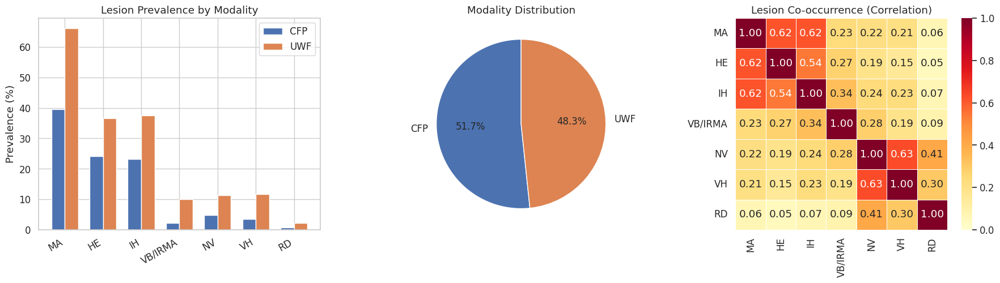

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style='whitegrid', font_scale=1.1)
COLORS = sns.color_palette('Set2', 7)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# ── Bar chart: lesion frequencies ──
ax = axes[0]
x = np.arange(7)
cfp_pcts = [cfp_labels[cfp_bn.str.startswith('tr').values, i].mean()*100 for i in range(7)]
uwf_pcts = [uwf_labels[uwf_bn.str.startswith('tr').values, i].mean()*100 for i in range(7)]
w = 0.35
ax.bar(x - w/2, cfp_pcts, w, label='CFP', color='#4C72B0', edgecolor='white')
ax.bar(x + w/2, uwf_pcts, w, label='UWF', color='#DD8452', edgecolor='white')
ax.set_xticks(x)
ax.set_xticklabels(LESION_DISPLAY, rotation=30, ha='right')
ax.set_ylabel('Prevalence (%)')
ax.set_title('Lesion Prevalence by Modality')
ax.legend()

# ── Pie chart: modality distribution ──
ax = axes[1]
sizes = [len(cfp_df), len(uwf_df)]
ax.pie(sizes, labels=['CFP', 'UWF'], autopct='%1.1f%%',
       colors=['#4C72B0', '#DD8452'], startangle=90,
       textprops={'fontsize': 12})
ax.set_title('Modality Distribution')

# ── Heatmap: co-occurrence ──
ax = axes[2]
all_labels = np.vstack([cfp_labels, uwf_labels])
cooc = np.corrcoef(all_labels.T)
sns.heatmap(cooc, ax=ax, xticklabels=LESION_DISPLAY, yticklabels=LESION_DISPLAY,
            annot=True, fmt='.2f', cmap='YlOrRd', vmin=0, vmax=1,
            square=True, linewidths=0.5)
ax.set_title('Lesion Co-occurrence (Correlation)')

plt.tight_layout()
plt.savefig('outputs/dataset_overview.png', dpi=100, bbox_inches='tight')
plt.show()

---
## Section 4 — Sample Visualization

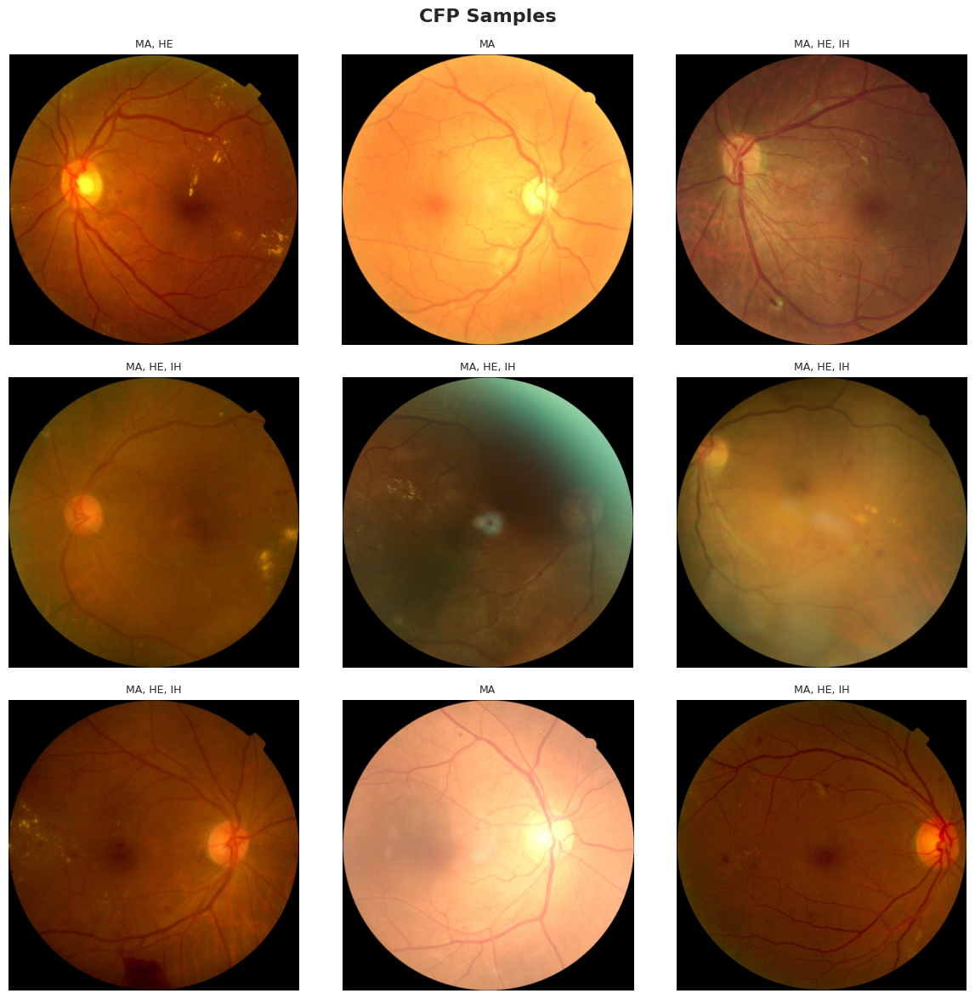

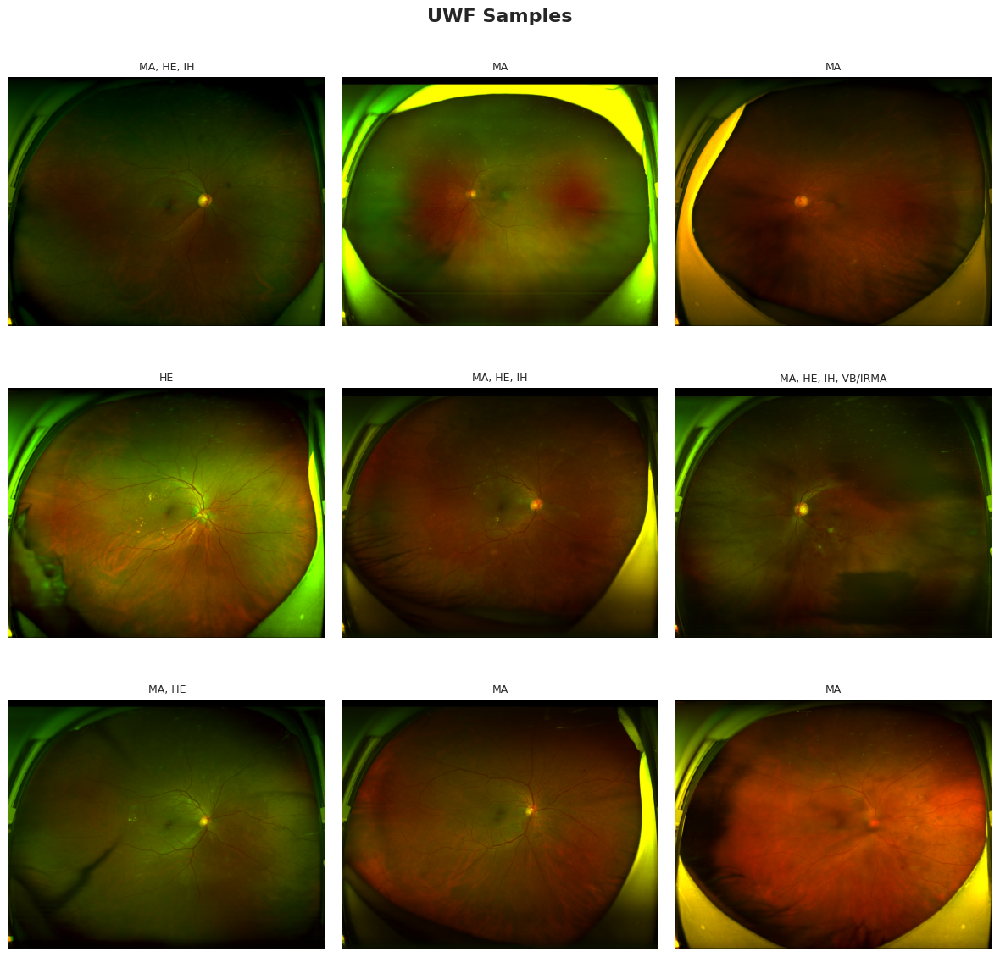

In [8]:
from PIL import Image
import random

random.seed(42)

def show_samples(df, img_root, modality, n=9):
    """Display a grid of retinal images with their lesion labels."""
    # Pick samples with at least one lesion
    labels_arr = parse_labels(df)
    has_lesion = labels_arr.sum(axis=1) > 0
    candidates = df.index[has_lesion].tolist()
    chosen = random.sample(candidates, min(n, len(candidates)))

    cols = 3
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))
    fig.suptitle(f'{modality} Samples', fontsize=16, fontweight='bold')

    for idx, ax in enumerate(axes.flat):
        if idx >= len(chosen):
            ax.axis('off'); continue
        row = df.iloc[chosen[idx]]
        img = Image.open(img_root / str(row['image'])).convert('RGB')
        lbl = ast.literal_eval(str(row['lesion']))
        present = [LESION_DISPLAY[i] for i, v in enumerate(lbl) if v == 1]
        ax.imshow(img)
        ax.set_title(', '.join(present) if present else 'No Lesion', fontsize=9)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

show_samples(cfp_df, DATA_DIR / 'MMRDR-CFP', 'CFP', n=9)
show_samples(uwf_df, DATA_DIR / 'MMRDR-UWF', 'UWF', n=9)


---
## Section 5 — Model Construction

In [9]:
from src.config import get_config
from src.model import Q2LLesionModel
from src.losses import AsymmetricLoss

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# ── Backbone weights path (Kaggle offline) ──
# Update this path to your uploaded ConvNeXt-V2-Base weights dataset
BACKBONE_WEIGHTS = None  # Set to path string for offline loading
_candidates = list(pathlib.Path('/kaggle/input').rglob('convnextv2_base*')) if pathlib.Path('/kaggle/input').exists() else []
if _candidates:
    BACKBONE_WEIGHTS = str(_candidates[0])
    print(f"Found backbone weights: {BACKBONE_WEIGHTS}")
else:
    print("No offline weights found. Will use timm pretrained download.")

# ── Build model (using Exp C config as reference) ──
cfg = get_config('c', project_root=PROJECT_ROOT)
model = Q2LLesionModel(cfg, weights_path=BACKBONE_WEIGHTS).to(DEVICE)

summary = model.param_summary()
print(f"\nBackbone: ConvNeXt-V2-Base")
print(f"  Total params:     {summary['backbone_total']:>12,}")
print(f"  Trainable params: {summary['backbone_trainable']:>12,}")
print(f"  Frozen params:    {summary['backbone_total'] - summary['backbone_trainable']:>12,}")
print(f"\nDecoder: Q2L (d=1024, 1enc+2dec, 4 heads)")
print(f"  Total params:     {summary['decoder_total']:>12,}")
print(f"  Trainable params: {summary['decoder_trainable']:>12,}")
print(f"\nFull model:")
print(f"  Total params:     {summary['total']:>12,}")
print(f"  Trainable params: {summary['trainable']:>12,}")

# ── Loss ──
criterion = AsymmetricLoss(gamma_pos=0.0, gamma_neg=4.0, clip=0.05)
print(f"\nLoss: ASL (gamma_pos={cfg.asl_gamma_pos}, gamma_neg={cfg.asl_gamma_neg}, clip={cfg.asl_clip})")

Found backbone weights: /kaggle/input/datasets/sanchitgarg999/convnextv2-base-weights/convnextv2_base_384.pth


/kaggle/working/src/q2l_decoder.py:159: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.encoder = nn.TransformerEncoder(



Backbone: ConvNeXt-V2-Base
  Total params:       87,690,752
  Trainable params:   87,690,752
  Frozen params:               0

Decoder: Q2L (d=1024, 1enc+2dec, 4 heads)
  Total params:       46,199,809
  Trainable params:   46,199,809

Full model:
  Total params:      133,890,561
  Trainable params:  133,890,561

Loss: ASL (gamma_pos=0.0, gamma_neg=6.0, clip=0.1)


---
## Section 6 — Forward Pass Validation

In [10]:
# ── Verify all tensor shapes through the pipeline ──
# Using B=2 for T4 GPU (16GB VRAM) to avoid OOM
model.eval()
B = 2  # Reduced for T4 GPU
dummy_img = torch.randn(B, 3, 512, 512, device=DEVICE)
dummy_mod = torch.tensor([0, 1], device=DEVICE)
dummy_lbl = torch.randint(0, 2, (B, 7), device=DEVICE).float()

with torch.no_grad(), torch.amp.autocast(device_type='cuda', enabled=cfg.use_amp):
    # Step-by-step
    features = model.backbone(dummy_img)
    print(f"Input image:        {dummy_img.shape}")
    print(f"Backbone output:    {features.shape}  (expected: [{B}, 1024, 16, 16])")
    
    logits = model.decoder(features, dummy_mod)
    print(f"Decoder output:     {logits.shape}  (expected: [{B}, 7])")
    
    probs = torch.sigmoid(logits)
    print(f"Probabilities:      {probs.shape}")
    print(f"  Sample probs:     {probs[0].cpu().numpy().round(3)}")
    
    loss = criterion(logits, dummy_lbl)
    print(f"\nASL loss:           {loss.item():.4f}")

assert features.shape == (B, 1024, 16, 16), "Backbone shape mismatch!"
assert logits.shape == (B, 7), "Decoder shape mismatch!"
print("\nAll shapes verified.")

# Report GPU memory usage on T4
if torch.cuda.is_available():
    allocated = torch.cuda.memory_allocated() / 1e9
    reserved = torch.cuda.memory_reserved() / 1e9
    print(f"\nT4 GPU Memory: {allocated:.2f} GB allocated, {reserved:.2f} GB reserved / 16 GB total")

del model, features, logits, dummy_img  # free memory
torch.cuda.empty_cache()


Input image:        torch.Size([2, 3, 512, 512])
Backbone output:    torch.Size([2, 1024, 16, 16])  (expected: [2, 1024, 16, 16])
Decoder output:     torch.Size([2, 7])  (expected: [2, 7])
Probabilities:      torch.Size([2, 7])
  Sample probs:     [0.373 0.362 0.365 0.366 0.397 0.341 0.342]

ASL loss:           0.0784

All shapes verified.

T4 GPU Memory: 0.57 GB allocated, 0.92 GB reserved / 16 GB total


---
## Section 7 — Experiment Launcher

Run experiments in order: **A** (CFP) -> **B** (UWF) -> **C** (Joint) -> decision gate -> **D** (CMQC).

Each cell calls `train.py` which handles the full training + threshold optimization pipeline.

In [11]:
import shutil, pathlib

_src = pathlib.Path('/kaggle/input/datasets/sanchitgarg999/q2l-mmrdr-outputs/outputs')
_dst = pathlib.Path('/kaggle/working/outputs')

if _src.exists():
    shutil.copytree(str(_src), str(_dst), dirs_exist_ok=True)
    print('Previous outputs restored:')
    for p in sorted(_dst.rglob('*.pth')):
        print(f'  {p.relative_to(_dst)}  ({p.stat().st_size/1e6:.0f} MB)')
    for p in sorted(_dst.rglob('*.json')):
        print(f'  {p.relative_to(_dst)}')
else:
    print(f'WARNING: {_src} not found — all experiments will start fresh')

Previous outputs restored:
  exp_a_cfp/best_model.pth  (2177 MB)
  exp_b_uwf/best_model.pth  (2177 MB)
  exp_c_joint/best_model.pth  (2177 MB)
  exp_d_cmqc/best_model.pth  (2177 MB)
  exp_d_cmqc/last_model.pth  (2177 MB)
  exp_a_cfp/config.json
  exp_a_cfp/results.json
  exp_a_cfp/thresholds.json
  exp_b_uwf/config.json
  exp_b_uwf/results.json
  exp_b_uwf/thresholds.json
  exp_c_joint/config.json
  exp_c_joint/results.json
  exp_c_joint/thresholds.json
  exp_d_cmqc/config.json


In [12]:
# ── Unified Experiment Launcher with Resume Support ──────────────────────────
# Runs A → B → C → D in sequence.
# Re-run this cell after a session timeout — completed experiments are skipped
# and interrupted ones resume automatically from last_model.pth.
#
# Disk safety (20 GB /kaggle/working quota):
#   • last_model.pth (~350 MB) is deleted after each completed experiment.
#   • checkpoint_epoch_*.pth are removed immediately after each experiment.
#   • A disk-guard warns (and optionally halts) if free space < 3 GB before
#     starting the next experiment.
#   • best_model.pth × 4 experiments ≈ 4 × 350 MB = ~1.4 GB total kept.
#   • src/ code   ≈ negligible
#   • outputs/    ≈ logs + results.json + plots ≈ <100 MB
#   • Symlinks to /tmp data take 0 bytes in working quota.
#
# How resume works (matches train.py exactly):
#   train.py saves last_model.pth after EVERY epoch (overwrites previous).
#   train.py saves best_model.pth only when val_F1 improves.
#   train.py accepts --resume <path> and restores epoch, optimizer,
#   scheduler, scaler, and EMA state — training continues seamlessly.
#
#   Done condition   : best_model.pth + results.json both exist  → SKIP
#   Resumable        : last_model.pth exists (session timed out) → RESUME
#   Fresh start      : neither exists                            → START

import pathlib, os, json as _json, shutil as _sh, glob as _glob

_output_root = pathlib.Path(PROJECT_ROOT) / 'outputs'
_BB = f'--backbone-weights {BACKBONE_WEIGHTS}' if BACKBONE_WEIGHTS else ''

# Minimum free space (GB) required before starting an experiment.
# Set to 0 to disable the guard.
DISK_GUARD_GB = 3.0


def _is_done(exp_name):
    d = _output_root / exp_name
    return (d / 'best_model.pth').exists() and (d / 'results.json').exists()


def _resume_ckpt(exp_name):
    """Return last_model.pth path if it exists (session was interrupted)."""
    p = _output_root / exp_name / 'last_model.pth'
    return str(p) if p.exists() else None


def _purge_intermediate_checkpoints(exp_name):
    """Remove checkpoint_epoch_*.pth and last_model.pth; keep best_model.pth."""
    removed_mb = 0.0
    for pattern in ['checkpoint_epoch_*.pth', 'last_model.pth']:
        for ck in _glob.glob(str(_output_root / exp_name / pattern)):
            sz = os.path.getsize(ck) / 1e6
            os.remove(ck)
            removed_mb += sz
            print(f'  Removed {os.path.basename(ck)}  ({sz:.0f} MB)')
    if removed_mb:
        print(f'  Total reclaimed: {removed_mb:.0f} MB')
    return removed_mb


def _disk_free_gb():
    """Return free space in /kaggle/working, in GB."""
    return _sh.disk_usage('/kaggle/working').free / 1e9


def _disk_report(label=''):
    usage = _sh.disk_usage('/kaggle/working')  # (total, used, free)
    tag = f' [{label}]' if label else ''
    print(f'  /kaggle/working{tag}: {usage.used/1e9:.1f} GB used, {usage.free/1e9:.1f} GB free')
    return usage.free / 1e9


def _disk_guard(exp_name):
    """Warn if free space is below DISK_GUARD_GB before starting an experiment."""
    if DISK_GUARD_GB <= 0:
        return True
    free_gb = _disk_free_gb()
    if free_gb < DISK_GUARD_GB:
        print(f'\n⚠  DISK WARNING: only {free_gb:.1f} GB free in /kaggle/working')
        print(f'   Experiment {exp_name} requires at least {DISK_GUARD_GB:.0f} GB.')
        print(f'   Tip: delete unused best_model.pth files from earlier experiments')
        print(f'        or reduce DISK_GUARD_GB to suppress this warning.')
        return False
    return True


def run_experiment(letter, exp_name, label):
    print()
    print('═' * 60)
    print(f'  EXPERIMENT {letter.upper()} — {label}')
    print('═' * 60)

    if _is_done(exp_name):
        try:
            res  = _json.loads((_output_root / exp_name / 'results.json').read_text())
            mods = list(res.keys())
            f1   = res[mods[0]].get('metrics_at_optimized', {}).get('macro_f1', '?')
            print(f'  ✓ Already complete — Macro F1 (test): {f1}')
        except Exception:
            print('  ✓ Already complete.')
        return

    # Disk guard before starting
    if not _disk_guard(exp_name):
        print('  Skipping to avoid running out of disk space.')
        print('  Free up space and re-run this cell.')
        return

    resume_path = _resume_ckpt(exp_name)
    if resume_path:
        import torch as _torch
        try:
            ck = _torch.load(resume_path, map_location='cpu', weights_only=False)
            resumed_epoch = ck.get('epoch', '?')
            best_f1       = ck.get('best_val_f1', '?')
            print(f'  ↩  Resuming from epoch {resumed_epoch}  (best val F1 so far: {best_f1})')
        except Exception as e:
            print(f'  ↩  Resuming from last_model.pth (could not read epoch: {e})')
        resume_arg = f'--resume {resume_path}'
    else:
        print('  ▶  Starting fresh')
        resume_arg = ''

    parts = [
        'python train.py',
        f'--experiment {letter}',
        f'--project-root {PROJECT_ROOT}',
        _BB,
        resume_arg,
    ]
    cmd = ' '.join(p for p in parts if p)
    print(f'  CMD: {cmd}')
    print()

    ret = os.system(cmd)

    if ret == 0:
        print(f'\n  ✓ Experiment {letter.upper()} complete')
        _purge_intermediate_checkpoints(exp_name)
    else:
        print(f'\n  ✗ Experiment {letter.upper()} exited with code {ret}')
        rp = _resume_ckpt(exp_name)
        if rp:
            import torch as _torch
            try:
                ck = _torch.load(rp, map_location='cpu', weights_only=False)
                print(f'  last_model.pth saved at epoch {ck.get("epoch","?")} — re-run cell to resume')
            except Exception:
                print(f'  last_model.pth saved — re-run this cell to resume')
        # On failure, still clean up any epoch checkpoints to free space
        for ck in _glob.glob(str(_output_root / exp_name / 'checkpoint_epoch_*.pth')):
            sz = os.path.getsize(ck) / 1e6
            os.remove(ck)
            print(f'  Removed stale {os.path.basename(ck)} ({sz:.0f} MB)')

    _disk_report(label=exp_name)


run_experiment('a', 'exp_a_cfp',   'CFP-only baseline')
run_experiment('b', 'exp_b_uwf',   'UWF-only baseline')
run_experiment('c', 'exp_c_joint', 'Joint CFP+UWF')
run_experiment('d', 'exp_d_cmqc',  'Joint CFP+UWF + CMQC')

print()
print('═' * 60)
print('  ALL EXPERIMENTS DONE (or timed out — re-run to resume)')
print('═' * 60)
_disk_report()


════════════════════════════════════════════════════════════
  EXPERIMENT A — CFP-only baseline
════════════════════════════════════════════════════════════
  ✓ Already complete — Macro F1 (test): 0.2182

════════════════════════════════════════════════════════════
  EXPERIMENT B — UWF-only baseline
════════════════════════════════════════════════════════════
  ✓ Already complete — Macro F1 (test): 0.3594

════════════════════════════════════════════════════════════
  EXPERIMENT C — Joint CFP+UWF
════════════════════════════════════════════════════════════
  ✓ Already complete — Macro F1 (test): 0.2165

════════════════════════════════════════════════════════════
  EXPERIMENT D — Joint CFP+UWF + CMQC
════════════════════════════════════════════════════════════
  ↩  Resuming from epoch 23  (best val F1 so far: 0.2975)
  CMD: python train.py --experiment d --project-root /kaggle/working --backbone-weights /kaggle/input/datasets/sanchitgarg999/convnextv2-base-weights/convnextv2_base_384.

Experiment: exp_d_cmqc
Description: Joint CFP+UWF with modality conditioning (Q2L + ASL + CMQC)
Modalities: ['cfp', 'uwf']
Backbone: ConvNeXt-V2-Base (d=1024, LOCKED)
Device: cuda
Output: /kaggle/working/outputs/exp_d_cmqc
Building dataloaders...
  Train batches: 1945
  Val batches:   261
  Test (cfp):    2225 samples
  Test (uwf):    2597 samples
Building model...
/kaggle/working/src/q2l_decoder.py:159: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.encoder = nn.TransformerEncoder(
  Backbone: 87,690,752 total, 87,690,752 trainable
  Decoder:  46,201,857 total, 46,201,857 trainable
  Total:    133,892,609 params, 133,892,609 trainable
  LR backbone: 1e-05
  LR decoder:  0.0001
  Weight decay: 0.05
Resuming from /kaggle/working/outputs/exp_d_cmqc/last_model.pth
  Resumed at epoch 24, best_val_f1=0.2975
Config saved to /kaggle/working/outputs/exp_d_cmqc/config.json

Starting training...
Ep  24/50 | loss=0.1


  ✓ Experiment D complete
  Removed last_model.pth  (2177 MB)
  Total reclaimed: 2177 MB
  /kaggle/working [exp_d_cmqc]: 8.7 GB used, 12.2 GB free

════════════════════════════════════════════════════════════
  ALL EXPERIMENTS DONE (or timed out — re-run to resume)
════════════════════════════════════════════════════════════
  /kaggle/working: 8.7 GB used, 12.2 GB free


12.230488064

In [13]:
# s7_exp_b is now handled by s7_launcher above.
print("Run the s7_launcher cell above to launch all experiments.")


Run the s7_launcher cell above to launch all experiments.


In [14]:
# s7_exp_c is now handled by s7_launcher above.
print("Run the s7_launcher cell above to launch all experiments.")


Run the s7_launcher cell above to launch all experiments.


In [15]:
# ── Experiment Progress & Resume Status ──────────────────────────────────────
# Run at any time to check which experiments are done / resumable.
# train.py saves last_model.pth every epoch — this is the resume checkpoint.

import pathlib, os, json as _json, shutil as _sh, torch as _torch

_output_root = pathlib.Path(PROJECT_ROOT) / 'outputs'
_exps = [
    ('exp_a_cfp',   'A: CFP-only'),
    ('exp_b_uwf',   'B: UWF-only'),
    ('exp_c_joint', 'C: Joint CFP+UWF'),
    ('exp_d_cmqc',  'D: CMQC'),
]

print('Experiment Status')
print('─' * 72)
print(f'  {"Experiment":<22} {"Status":<22} {"Best F1":>8}  Resume from')
print('─' * 72)

for exp_name, label in _exps:
    d = _output_root / exp_name
    has_best   = (d / 'best_model.pth').exists()
    has_result = (d / 'results.json').exists()
    last_ckpt  = d / 'last_model.pth'

    if has_best and has_result:
        try:
            res  = _json.loads((d / 'results.json').read_text())
            mods = list(res.keys())
            f1   = res[mods[0]].get('metrics_at_optimized', {}).get('macro_f1', None)
            f1_s = f'{f1:.4f}' if f1 else '—'
        except Exception:
            f1_s = '—'
        status   = '✓ Complete'
        resume_s = '—'
    elif last_ckpt.exists():
        try:
            ck       = _torch.load(str(last_ckpt), map_location='cpu', weights_only=False)
            ep       = ck.get('epoch', '?')
            best_f1v = ck.get('best_val_f1', 0.0)
            status   = f'↩  Interrupted ep {ep}'
            f1_s     = f'{best_f1v:.4f}' if best_f1v else '—'
        except Exception:
            status   = '↩  last_model.pth found'
            f1_s     = '—'
        resume_s = 'last_model.pth'
    elif d.exists() and any(d.iterdir()):
        status   = '⚠  Partial (no ckpt)'
        f1_s     = '—'
        resume_s = '—'
    else:
        status   = '○  Not started'
        f1_s     = '—'
        resume_s = '—'

    print(f'  {label:<22} {status:<22} {f1_s:>8}  {resume_s}')

print('─' * 72)

# Checkpoint sizes
ckpt_mb = sum(
    os.path.getsize(str(p)) for p in _output_root.rglob('*.pth')
    if p.exists()
) / 1e6
# FIX: disk_usage returns a 3-field named tuple (total, used, free).
# Unpacking into 2 variables raises ValueError. Use attribute access instead.
_du = _sh.disk_usage('/kaggle/working')
used, free = _du.used, _du.free
print(f'\n/kaggle/working : {used/1e9:.1f} GB used, {free/1e9:.1f} GB free')
print(f'Checkpoint files: {ckpt_mb:.0f} MB total')
print()
print('To resume after session timeout:')
print('  1. Re-run all Section 2 cells (environment + extraction + paths)')
print('  2. Re-run s7_launcher — it detects last_model.pth and resumes automatically')

# ── Disk budget summary ───────────────────────────────────────────────────────
print()
print('Checkpoint File Budget')
print('─' * 72)
_ckpt_files = list(_output_root.rglob('*.pth'))
_total_mb = sum(p.stat().st_size for p in _ckpt_files) / 1e6
for _p in sorted(_ckpt_files):
    _sz = _p.stat().st_size / 1e6
    _tag = '  ← intermediate (safe to delete)' if 'epoch' in _p.name or _p.name == 'last_model.pth' else ''
    print(f'  {_p.relative_to(_output_root)}  ({_sz:.0f} MB){_tag}')
# FIX: same correction for the second disk_usage call in this cell.
_du2 = _sh.disk_usage('/kaggle/working')
_used, _free = _du2.used, _du2.free
print(f'─' * 72)
print(f'Total checkpoint size: {_total_mb:.0f} MB')
print(f'/kaggle/working: {_used/1e9:.1f} GB used, {_free/1e9:.1f} GB free (20 GB quota)')
print()
print('💡 Tip: run the s7_disk_cleanup cell to remove intermediate checkpoints.')

Experiment Status
────────────────────────────────────────────────────────────────────────
  Experiment             Status                  Best F1  Resume from
────────────────────────────────────────────────────────────────────────
  A: CFP-only            ✓ Complete               0.2182  —
  B: UWF-only            ✓ Complete               0.3594  —
  C: Joint CFP+UWF       ✓ Complete               0.2165  —
  D: CMQC                ✓ Complete               0.2165  —
────────────────────────────────────────────────────────────────────────

/kaggle/working : 8.7 GB used, 12.2 GB free
Checkpoint files: 8706 MB total

To resume after session timeout:
  1. Re-run all Section 2 cells (environment + extraction + paths)
  2. Re-run s7_launcher — it detects last_model.pth and resumes automatically

Checkpoint File Budget
────────────────────────────────────────────────────────────────────────
  exp_a_cfp/best_model.pth  (2177 MB)
  exp_b_uwf/best_model.pth  (2177 MB)
  exp_c_joint/best_model

In [16]:
# ── Decision Gate: Is joint training beneficial? ──
import json

def load_results(exp_name):
    p = pathlib.Path(PROJECT_ROOT) / 'outputs' / exp_name / 'results.json'
    if not p.exists():
        print(f"  {exp_name}: not yet run"); return None
    with open(p) as f: return json.load(f)

res_a = load_results('exp_a_cfp')
res_b = load_results('exp_b_uwf')
res_c = load_results('exp_c_joint')

if all([res_a, res_b, res_c]):
    f1_a = res_a.get('cfp', {}).get('metrics_at_optimized', {}).get('macro_f1', 0)
    f1_b = res_b.get('uwf', {}).get('metrics_at_optimized', {}).get('macro_f1', 0)
    f1_c_cfp = res_c.get('cfp', {}).get('metrics_at_optimized', {}).get('macro_f1', 0)
    f1_c_uwf = res_c.get('uwf', {}).get('metrics_at_optimized', {}).get('macro_f1', 0)
    
    print('=== Decision Gate ===')
    print(f'  Exp A (CFP-only):  CFP F1 = {f1_a:.4f}')
    print(f'  Exp B (UWF-only):  UWF F1 = {f1_b:.4f}')
    print(f'  Exp C (Joint):     CFP F1 = {f1_c_cfp:.4f}  UWF F1 = {f1_c_uwf:.4f}')
    print()
    cfp_pass = f1_c_cfp >= f1_a
    uwf_pass = f1_c_uwf >= f1_b
    print(f'  CFP: Joint {">=" if cfp_pass else "<"} Separate  ({"PASS" if cfp_pass else "FAIL"})')
    print(f'  UWF: Joint {">=" if uwf_pass else "<"} Separate  ({"PASS" if uwf_pass else "FAIL"})')
    print(f'\n  Proceed to Exp D: {"YES" if (cfp_pass and uwf_pass) else "INVESTIGATE FIRST"}')
else:
    print('Run experiments A, B, C first.')

=== Decision Gate ===
  Exp A (CFP-only):  CFP F1 = 0.2182
  Exp B (UWF-only):  UWF F1 = 0.3594
  Exp C (Joint):     CFP F1 = 0.2165  UWF F1 = 0.3594

  CFP: Joint < Separate  (FAIL)
  UWF: Joint >= Separate  (PASS)

  Proceed to Exp D: INVESTIGATE FIRST


In [17]:
# s7_exp_d is now handled by s7_launcher above.
print("Run the s7_launcher cell above to launch all experiments.")


Run the s7_launcher cell above to launch all experiments.


In [18]:
# ── Manual Disk Cleanup ────────────────────────────────────────────────────
# Run this cell any time /kaggle/working is running low on space.
# Removes intermediate checkpoints (checkpoint_epoch_*.pth, last_model.pth)
# from ALL experiments while keeping best_model.pth (needed for analysis).
# Also clears the GPU cache.

import glob, os, pathlib, shutil, torch

_output_root = pathlib.Path(PROJECT_ROOT) / 'outputs'
total_removed = 0.0

for pattern in ['checkpoint_epoch_*.pth', 'last_model.pth']:
    for ck in glob.glob(str(_output_root / '*' / pattern)):
        sz = os.path.getsize(ck) / 1e6
        os.remove(ck)
        total_removed += sz
        print(f'  Removed {os.path.relpath(ck, str(_output_root))}  ({sz:.0f} MB)')

if total_removed:
    print(f'\nTotal reclaimed: {total_removed:.0f} MB')
else:
    print('No intermediate checkpoints found — nothing to remove.')

torch.cuda.empty_cache()
print('GPU cache cleared.')

# FIX: shutil.disk_usage returns a 3-field named tuple (total, used, free).
# Unpacking into 2 variables raises ValueError. Use attribute access instead.
_du = shutil.disk_usage('/kaggle/working')
used, free = _du.used, _du.free
print(f'\n/kaggle/working: {used/1e9:.1f} GB used, {free/1e9:.1f} GB free')

No intermediate checkpoints found — nothing to remove.
GPU cache cleared.

/kaggle/working: 8.7 GB used, 12.2 GB free


---
## Section 8 — Training Monitoring

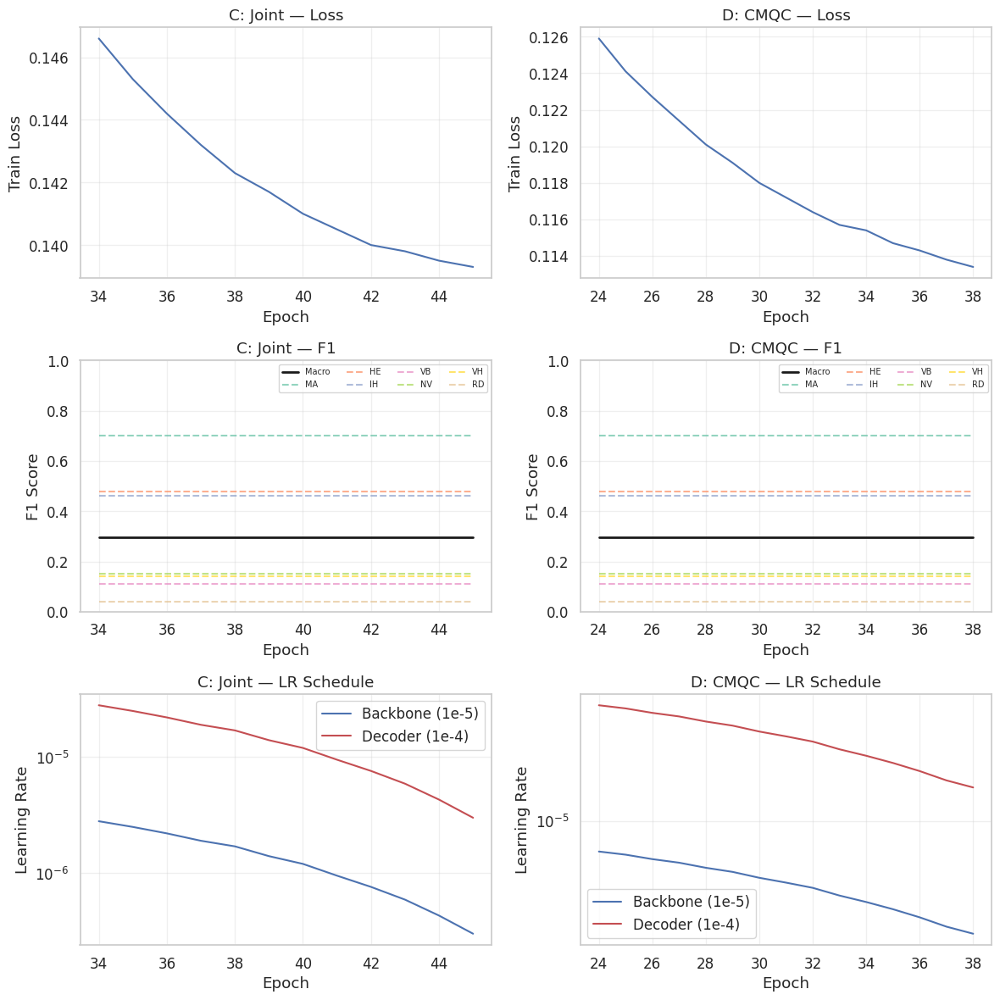

In [19]:
import re

def parse_train_log(exp_name):
    """Parse train.log into a DataFrame of per-epoch metrics."""
    log_path = pathlib.Path(PROJECT_ROOT) / 'outputs' / exp_name / 'train.log'
    if not log_path.exists(): return None
    
    epochs, losses, f1s = [], [], []
    per_class = {n: [] for n in ['MA','HE','IH','VB','NV','VH','RD']}
    lr_bbs, lr_decs = [], []
    
    pattern = re.compile(
        r'Ep\s+(\d+)/(\d+)\s+\|\s+loss=([\d.]+)\s+\|\s+.*?F1=([\d.]+)\s+\|\s+'
        r'MA=([\d.]+)\s+HE=([\d.]+)\s+IH=([\d.]+)\s+VB=([\d.]+)\s+'
        r'NV=([\d.]+)\s+VH=([\d.]+)\s+RD=([\d.]+)\s+\|\s+'
        r'lr_bb=([\d.e+-]+)\s+lr_dec=([\d.e+-]+)'
    )
    
    for line in log_path.read_text(encoding='utf-8').splitlines():
        m = pattern.search(line)
        if m:
            epochs.append(int(m.group(1)))
            losses.append(float(m.group(3)))
            f1s.append(float(m.group(4)))
            for i, n in enumerate(['MA','HE','IH','VB','NV','VH','RD']):
                per_class[n].append(float(m.group(5+i)))
            lr_bbs.append(float(m.group(12)))
            lr_decs.append(float(m.group(13)))
    
    if not epochs: return None
    df = pd.DataFrame({'epoch': epochs, 'loss': losses, 'macro_f1': f1s,
                       'lr_backbone': lr_bbs, 'lr_decoder': lr_decs, **per_class})
    return df


def plot_training(exp_names, titles):
    """Plot loss, F1, per-class F1, and LR curves for given experiments."""
    dfs = {n: parse_train_log(n) for n in exp_names}
    dfs = {k: v for k, v in dfs.items() if v is not None}
    if not dfs:
        print('No training logs found. Run experiments first.'); return
    
    n_exp = len(dfs)
    fig, axes = plt.subplots(3, n_exp, figsize=(6*n_exp, 12), squeeze=False)
    
    for col, (name, df) in enumerate(dfs.items()):
        title = titles.get(name, name)
        
        # Row 1: Loss
        ax = axes[0, col]
        ax.plot(df['epoch'], df['loss'], 'b-', linewidth=1.5)
        ax.set_xlabel('Epoch'); ax.set_ylabel('Train Loss')
        ax.set_title(f'{title} — Loss'); ax.grid(True, alpha=0.3)
        
        # Row 2: Macro F1 + per-class F1
        ax = axes[1, col]
        ax.plot(df['epoch'], df['macro_f1'], 'k-', linewidth=2, label='Macro')
        for i, n in enumerate(['MA','HE','IH','VB','NV','VH','RD']):
            ax.plot(df['epoch'], df[n], '--', color=COLORS[i], alpha=0.7, label=n)
        ax.set_xlabel('Epoch'); ax.set_ylabel('F1 Score')
        ax.set_title(f'{title} — F1'); ax.legend(fontsize=7, ncol=4)
        ax.grid(True, alpha=0.3); ax.set_ylim(0, 1)
        
        # Row 3: LR
        ax = axes[2, col]
        ax.plot(df['epoch'], df['lr_backbone'], 'b-', label='Backbone (1e-5)')
        ax.plot(df['epoch'], df['lr_decoder'], 'r-', label='Decoder (1e-4)')
        ax.set_xlabel('Epoch'); ax.set_ylabel('Learning Rate')
        ax.set_title(f'{title} — LR Schedule'); ax.legend()
        ax.set_yscale('log'); ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('outputs/training_curves.png', dpi=100, bbox_inches='tight')
    plt.show()


plot_training(
    ['exp_a_cfp', 'exp_b_uwf', 'exp_c_joint', 'exp_d_cmqc'],
    {'exp_a_cfp': 'A: CFP', 'exp_b_uwf': 'B: UWF',
     'exp_c_joint': 'C: Joint', 'exp_d_cmqc': 'D: CMQC'}
)

--- ## Section 9 — Threshold Optimization Visualization

**Consolidated:** this section now performs the single model load + val/test inference pass that feeds Sections 9, 11, 12, 13, 14, and 16. All downstream sections reuse the cached `PRED_CACHE` instead of reloading the model or re-running inference.

/kaggle/working/src/q2l_decoder.py:159: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.encoder = nn.TransformerEncoder(


Cached predictions for Exp C:
  Val:  2,086 samples
  Test (cfp): 2,225 samples
  Test (uwf): 2,597 samples
  Attention samples: {'cfp': 3, 'uwf': 3}


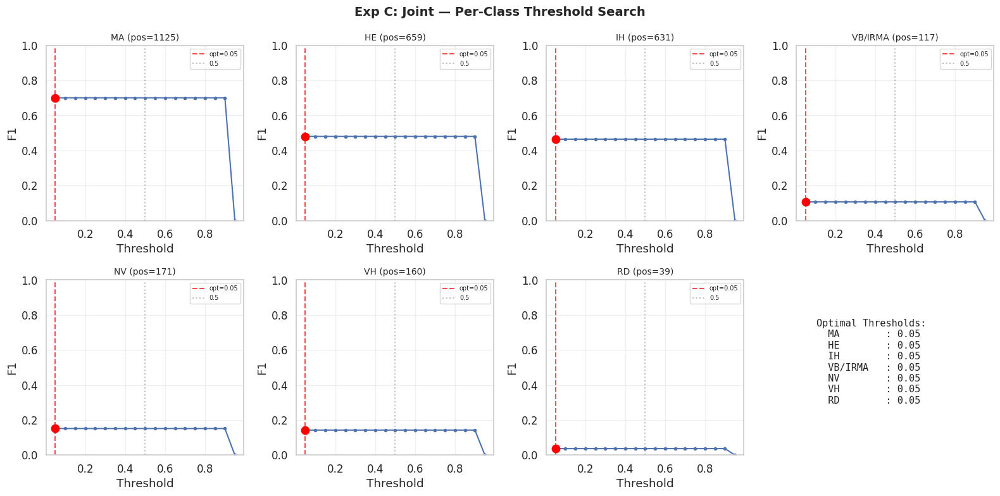

In [20]:
from src.dataset import build_dataloaders
from src.threshold import _collect_predictions
from sklearn.metrics import f1_score as sk_f1
import contextlib
import torch.nn.functional as F

# ── Choose which experiment's checkpoint drives the analysis section ──
# Default to Exp C (joint naive merge). If Exp D was run and the final
# dashboard (Section 17) shows it wins, change this to 'd' and re-run
# this cell once — every downstream cell (Sections 9-16) will then use
# the cached predictions from that experiment automatically.
EXP_KEY = 'c'


def load_experiment_model(exp_key):
    """Build the model and load its best checkpoint. Returns (model, cfg) or (None, None)."""
    cfg_e = get_config(exp_key, project_root=PROJECT_ROOT)
    ckpt_path = cfg_e.output_dir / 'best_model.pth'
    if not ckpt_path.exists():
        return None, cfg_e
    mdl = Q2LLesionModel(cfg_e, weights_path=BACKBONE_WEIGHTS).to(DEVICE)
    ckpt = torch.load(ckpt_path, map_location=DEVICE, weights_only=False)
    mdl.load_state_dict(ckpt.get('ema_state_dict', ckpt['model_state_dict']))
    mdl.eval()
    return mdl, cfg_e


@contextlib.contextmanager
def capture_cross_attention(decoder_module):
    """Temporarily hook cross-attention layers to capture weights.

    Uses forward hooks on nn.MultiheadAttention modules without
    modifying any source files.
    """
    attn_maps = {}
    hooks = []

    for i, layer in enumerate(decoder_module.decoder.layers):
        mha = layer.multihead_attn
        orig_forward = mha.forward

        def make_patched(idx, orig):
            def patched(*args, **kwargs):
                kwargs['need_weights'] = True
                kwargs['average_attn_weights'] = True
                out = orig(*args, **kwargs)
                attn_maps[f'decoder_layer_{idx}'] = out[1].detach().cpu()
                return out
            return patched

        mha.forward = make_patched(i, orig_forward)
        hooks.append((mha, orig_forward))

    try:
        yield attn_maps
    finally:
        for mha, orig in hooks:
            mha.forward = orig


# ── Single load / single pass: build a shared prediction cache ────────
# This replaces the per-cell model reloads + repeated full-dataset
# inference that used to happen independently in the threshold search,
# confusion matrix, ROC, PR, attention, and error-analysis cells.
PRED_CACHE = {}

_model, _cfg = load_experiment_model(EXP_KEY)

if _model is None:
    print(f"Experiment '{EXP_KEY}': no checkpoint found at "
          f"{_cfg.output_dir / 'best_model.pth'}. Run the corresponding "
          f"training cell first.")
else:
    thresh_path = _cfg.output_dir / 'thresholds.json'
    with open(thresh_path) as f:
        PRED_CACHE['thresholds'] = json.load(f)

    _, val_loader, test_loaders = build_dataloaders(_cfg)

    # Validation predictions — drives threshold-search curves (Section 9)
    val_probs, val_labels = _collect_predictions(_model, val_loader, DEVICE, _cfg.use_amp)
    PRED_CACHE['val'] = {'probs': val_probs, 'labels': val_labels}

    # Test predictions per modality — drives confusion/ROC/PR/error analysis
    # (Sections 11, 12, 13, 16). Each test set is traversed exactly once.
    PRED_CACHE['test'] = {}
    for mod, tl in test_loaders.items():
        probs, labels = _collect_predictions(_model, tl, DEVICE, _cfg.use_amp)
        PRED_CACHE['test'][mod] = {'probs': probs, 'labels': labels, 'dataset': tl.dataset}

    # A handful of attention samples per modality — drives Section 14.
    # Hooks are attached to the SAME model instance, so no extra reload.
    PRED_CACHE['attention'] = {}
    for mod, tl in test_loaders.items():
        images, labels_b, mod_ids = next(iter(tl))
        n_samples = min(3, images.size(0))
        images_s = images[:n_samples].to(DEVICE)
        if isinstance(mod_ids, int):
            mod_ids_s = torch.full((n_samples,), mod_ids, dtype=torch.long, device=DEVICE)
        else:
            mod_ids_s = mod_ids[:n_samples].to(DEVICE)

        with capture_cross_attention(_model.decoder) as attn_maps:
            with torch.no_grad():
                logits_s = _model(images_s, mod_ids_s)

        last_key = sorted(attn_maps.keys())[-1]
        PRED_CACHE['attention'][mod] = {
            'images': images_s.cpu(),
            'labels': labels_b[:n_samples],
            'attn': attn_maps[last_key],
            'logits': logits_s.detach().cpu(),
        }

    PRED_CACHE['exp_key'] = EXP_KEY
    PRED_CACHE['cfg'] = _cfg

    print(f"Cached predictions for Exp {EXP_KEY.upper()}:")
    print(f"  Val:  {len(val_labels):,} samples")
    for mod, d in PRED_CACHE['test'].items():
        print(f"  Test ({mod}): {len(d['labels']):,} samples")
    print("  Attention samples:", {m: len(d['labels']) for m, d in PRED_CACHE['attention'].items()})

# Free the model — everything downstream uses PRED_CACHE only.
del _model
torch.cuda.empty_cache()


# ── Threshold search visualization (consumes PRED_CACHE['val']) ───────
def visualize_threshold_search(exp_name):
    if 'val' not in PRED_CACHE:
        print('No cached predictions available.'); return

    probs, labels = PRED_CACHE['val']['probs'], PRED_CACHE['val']['labels']
    opt_thresholds = PRED_CACHE['thresholds']
    thresholds_range = np.arange(0.05, 0.96, 0.05)

    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    fig.suptitle(f'{exp_name} — Per-Class Threshold Search', fontsize=14, fontweight='bold')

    for j, ax in enumerate(axes.flat[:7]):
        name = LESION_NAMES[j]
        disp = LESION_DISPLAY[j]
        f1s = [sk_f1(labels[:, j], (probs[:, j] >= t).astype(int), zero_division=0)
               for t in thresholds_range]
        ax.plot(thresholds_range, f1s, 'b-o', markersize=3)
        opt_t = opt_thresholds.get(name, 0.5)
        opt_f1 = sk_f1(labels[:, j], (probs[:, j] >= opt_t).astype(int), zero_division=0)
        ax.axvline(opt_t, color='red', linestyle='--', alpha=0.7, label=f'opt={opt_t:.2f}')
        ax.axvline(0.5, color='gray', linestyle=':', alpha=0.5, label='0.5')
        ax.scatter([opt_t], [opt_f1], color='red', s=80, zorder=5)
        ax.set_title(f'{disp} (pos={int(labels[:, j].sum())})', fontsize=10)
        ax.set_xlabel('Threshold'); ax.set_ylabel('F1')
        ax.set_ylim(0, 1); ax.legend(fontsize=7); ax.grid(True, alpha=0.3)

    axes[1, 3].axis('off')
    text = 'Optimal Thresholds:\n'
    for n, d in zip(LESION_NAMES, LESION_DISPLAY):
        text += f'  {d:10s}: {opt_thresholds.get(n, 0.5):.2f}\n'
    axes[1, 3].text(0.1, 0.5, text, fontsize=11, family='monospace',
                    verticalalignment='center', transform=axes[1, 3].transAxes)

    plt.tight_layout()
    plt.show()


if 'val' in PRED_CACHE:
    visualize_threshold_search(f"Exp {EXP_KEY.upper()}: Joint")


---
## Section 10 — Evaluation & Comparison

In [21]:
from src.metrics import compute_metrics

def load_all_results():
    """Load results.json from all experiments that have been run."""
    experiments = {
        'exp_a_cfp': 'A: CFP',
        'exp_b_uwf': 'B: UWF',
        'exp_c_joint': 'C: Joint',
        'exp_d_cmqc': 'D: CMQC',
    }
    all_res = {}
    for exp_dir, label in experiments.items():
        p = pathlib.Path(PROJECT_ROOT) / 'outputs' / exp_dir / 'results.json'
        if p.exists():
            with open(p) as f:
                all_res[label] = json.load(f)
    return all_res

all_results = load_all_results()

if not all_results:
    print('No results found. Run experiments first.')
else:
    # Build comparison table
    rows = []
    for exp_label, res in all_results.items():
        for modality, mdata in res.items():
            m05 = mdata.get('metrics_at_0.5', {})
            mopt = mdata.get('metrics_at_optimized', {})
            row = {
                'Experiment': exp_label,
                'Test Set': modality.upper(),
                'Macro F1 @0.5': m05.get('macro_f1', '-'),
                'Macro F1 @opt': mopt.get('macro_f1', '-'),
                'Accuracy': mopt.get('element_accuracy', '-'),
                'Exact Match': mopt.get('exact_match', '-'),
            }
            for name, disp in zip(LESION_NAMES, LESION_DISPLAY):
                row[f'{disp} F1'] = mopt.get(f'{name}_f1', '-')
            rows.append(row)
    
    comp_df = pd.DataFrame(rows)
    print('=== Final Results Comparison ===')
    display(comp_df)

=== Final Results Comparison ===


,Experiment,Test Set,Macro F1 @0.5,Macro F1 @opt,Accuracy,Exact Match,MA F1,HE F1,IH F1,VB/IRMA F1,NV F1,VH F1,RD F1
0,A: CFP,CFP,0.2165,0.2182,0.2088,0.0000,0.5650,0.3706,0.3735,0.0379,0.1032,0.0465,0.0304
1,B: UWF,UWF,0.3594,0.3594,0.2522,0.0031,0.8114,0.5512,0.5257,0.1634,0.2077,0.2083,0.0481
2,C: Joint,CFP,0.2165,0.2165,0.1368,0.0000,0.5650,0.3706,0.3735,0.0379,0.1032,0.0465,0.0187
3,C: Joint,UWF,0.3594,0.3594,0.2522,0.0031,0.8114,0.5512,0.5257,0.1634,0.2077,0.2083,0.0481
4,D: CMQC,CFP,0.2165,0.2165,0.1368,0.0000,0.5650,0.3706,0.3735,0.0379,0.1032,0.0465,0.0187
5,D: CMQC,UWF,0.3594,0.3594,0.2522,0.0031,0.8114,0.5512,0.5257,0.1634,0.2077,0.2083,0.0481


---
## Section 11 — Confusion Analysis

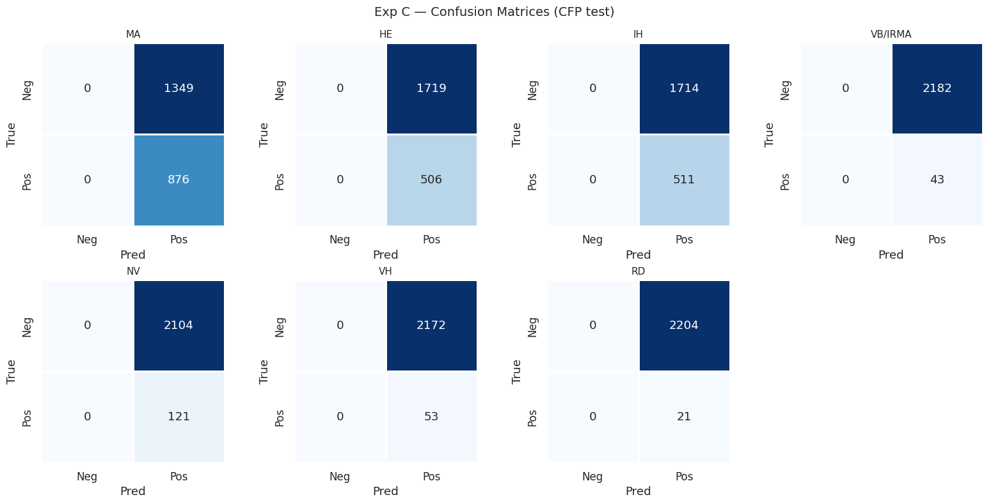

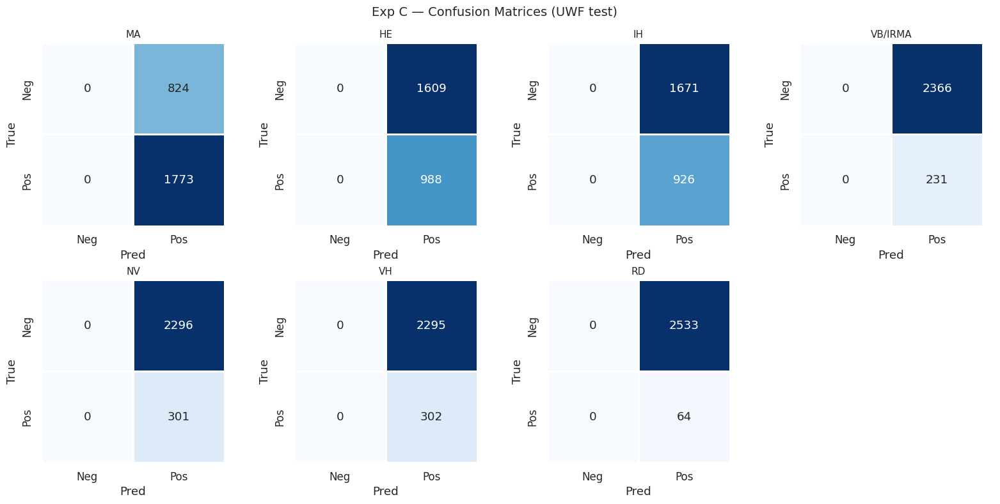

In [22]:
from sklearn.metrics import confusion_matrix

def plot_confusion_matrices(modality, exp_title):
    """Generate 2x2 confusion matrices for each lesion class (cached predictions)."""
    if modality not in PRED_CACHE.get('test', {}):
        print(f'No cached test predictions for {modality}.'); return

    probs, labels = PRED_CACHE['test'][modality]['probs'], PRED_CACHE['test'][modality]['labels']
    thresholds = PRED_CACHE['thresholds']
    t = np.array([thresholds.get(n, 0.5) for n in LESION_NAMES])
    preds = (probs >= t).astype(int)

    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    fig.suptitle(f'{exp_title} — Confusion Matrices ({modality.upper()} test)', fontsize=14)

    for j, ax in enumerate(axes.flat[:7]):
        cm = confusion_matrix(labels[:, j], preds[:, j], labels=[0, 1])
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax,
                    xticklabels=['Neg', 'Pos'], yticklabels=['Neg', 'Pos'],
                    cbar=False, square=True, linewidths=1)
        ax.set_title(f'{LESION_DISPLAY[j]}', fontsize=11)
        ax.set_ylabel('True'); ax.set_xlabel('Pred')

    axes[1, 3].axis('off')
    plt.tight_layout()
    plt.show()

_exp_title = f"Exp {PRED_CACHE.get('exp_key', EXP_KEY).upper()}"
for mod in PRED_CACHE.get('test', {}):
    plot_confusion_matrices(mod, _exp_title)


---
## Section 12 — ROC Curves

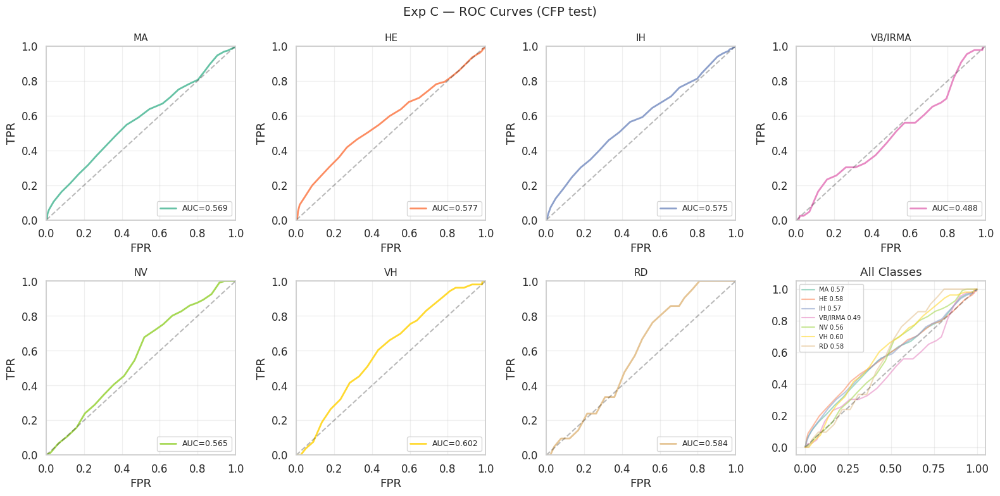

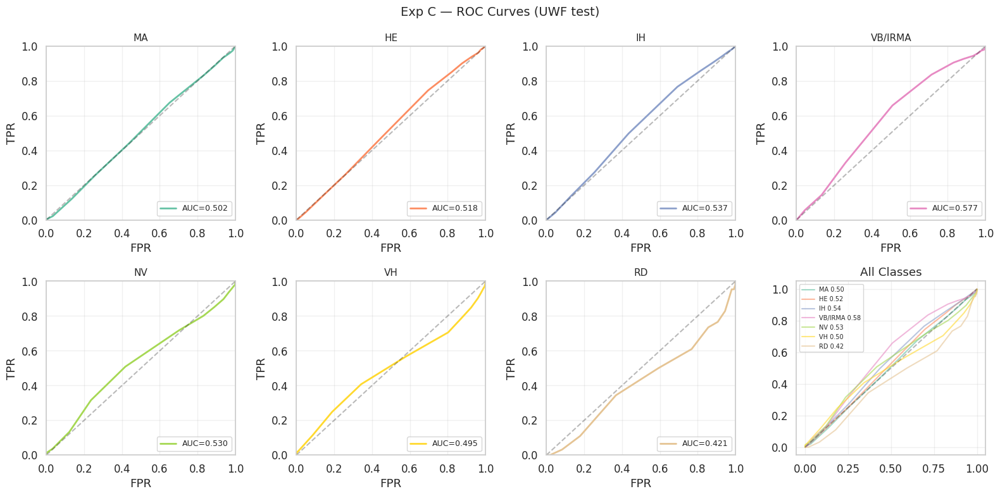

In [23]:
from sklearn.metrics import roc_curve, roc_auc_score

def plot_roc_curves(modality, exp_title, exp_key):
    if modality not in PRED_CACHE.get('test', {}):
        print(f'No cached test predictions for {modality}.'); return

    probs, labels = PRED_CACHE['test'][modality]['probs'], PRED_CACHE['test'][modality]['labels']

    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    fig.suptitle(f'{exp_title} — ROC Curves ({modality.upper()} test)', fontsize=14)

    for j, ax in enumerate(axes.flat[:7]):
        y_true, y_score = labels[:, j], probs[:, j]
        if y_true.sum() == 0 or y_true.sum() == len(y_true):
            ax.text(0.5, 0.5, 'N/A', ha='center', va='center'); ax.set_title(LESION_DISPLAY[j]); continue
        fpr, tpr, _ = roc_curve(y_true, y_score)
        auc = roc_auc_score(y_true, y_score)
        ax.plot(fpr, tpr, color=COLORS[j], linewidth=2, label=f'AUC={auc:.3f}')
        ax.plot([0,1], [0,1], 'k--', alpha=0.3)
        ax.set_xlabel('FPR'); ax.set_ylabel('TPR')
        ax.set_title(f'{LESION_DISPLAY[j]}', fontsize=11)
        ax.legend(loc='lower right', fontsize=9); ax.grid(True, alpha=0.3)
        ax.set_xlim(0,1); ax.set_ylim(0,1)

    ax = axes[1, 3]
    for j in range(7):
        y_true, y_score = labels[:, j], probs[:, j]
        if y_true.sum() > 0 and y_true.sum() < len(y_true):
            fpr, tpr, _ = roc_curve(y_true, y_score)
            auc = roc_auc_score(y_true, y_score)
            ax.plot(fpr, tpr, color=COLORS[j], alpha=0.6, label=f'{LESION_DISPLAY[j]} {auc:.2f}')
    ax.plot([0,1], [0,1], 'k--', alpha=0.3)
    ax.set_title('All Classes'); ax.legend(fontsize=7); ax.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig(f'outputs/roc_{exp_key}_{modality}.png', dpi=100, bbox_inches='tight')
    plt.show()

_exp_key = PRED_CACHE.get('exp_key', EXP_KEY)
_exp_title = f"Exp {_exp_key.upper()}"
for mod in PRED_CACHE.get('test', {}):
    plot_roc_curves(mod, _exp_title, _exp_key)


---
## Section 13 — Precision-Recall Curves

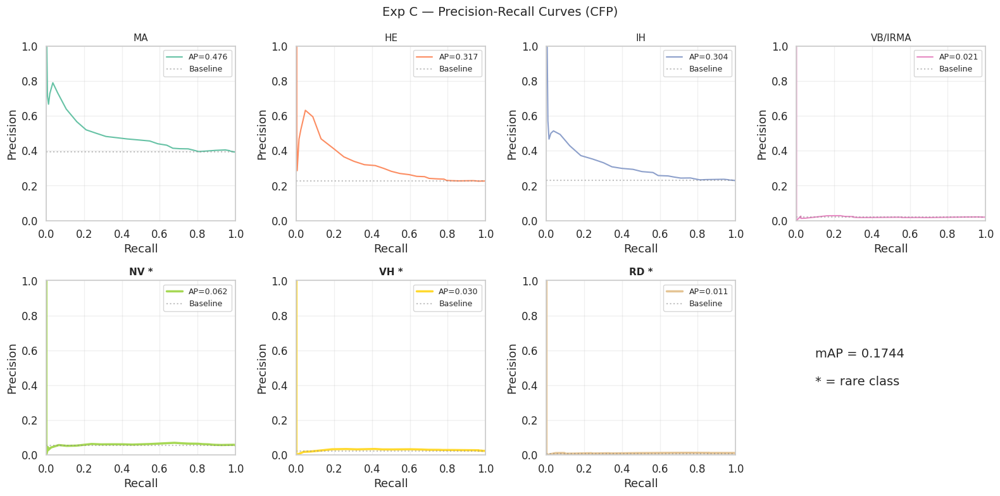

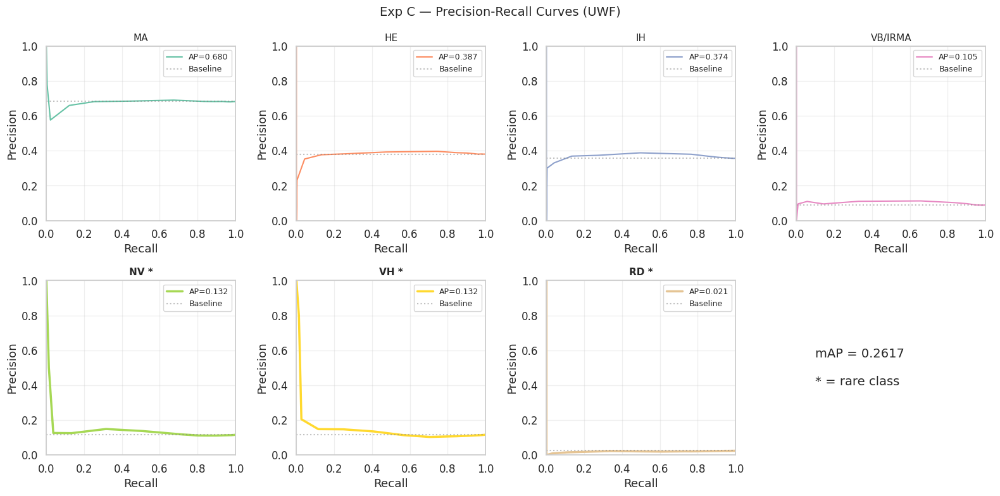

In [24]:
from sklearn.metrics import precision_recall_curve, average_precision_score

def plot_pr_curves(modality, exp_title, exp_key):
    if modality not in PRED_CACHE.get('test', {}):
        print(f'No cached test predictions for {modality}.'); return

    probs, labels = PRED_CACHE['test'][modality]['probs'], PRED_CACHE['test'][modality]['labels']

    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    fig.suptitle(f'{exp_title} — Precision-Recall Curves ({modality.upper()})', fontsize=14)

    rare_classes = {'NV', 'VH', 'RD'}

    for j, ax in enumerate(axes.flat[:7]):
        y_true, y_score = labels[:, j], probs[:, j]
        if y_true.sum() == 0:
            ax.text(0.5, 0.5, 'No positives', ha='center', va='center')
            ax.set_title(LESION_DISPLAY[j]); continue
        prec, rec, _ = precision_recall_curve(y_true, y_score)
        ap = average_precision_score(y_true, y_score)
        lw = 2.5 if LESION_DISPLAY[j] in rare_classes else 1.5
        ax.plot(rec, prec, color=COLORS[j], linewidth=lw, label=f'AP={ap:.3f}')
        ax.axhline(y_true.mean(), color='gray', linestyle=':', alpha=0.5, label='Baseline')
        ax.set_xlabel('Recall'); ax.set_ylabel('Precision')
        is_rare = ' *' if LESION_DISPLAY[j] in rare_classes else ''
        ax.set_title(f'{LESION_DISPLAY[j]}{is_rare}', fontsize=11,
                     fontweight='bold' if LESION_DISPLAY[j] in rare_classes else 'normal')
        ax.legend(loc='upper right', fontsize=9); ax.grid(True, alpha=0.3)
        ax.set_xlim(0,1); ax.set_ylim(0,1)

    axes[1, 3].axis('off')
    mAP = np.mean([average_precision_score(labels[:, j], probs[:, j])
                   for j in range(7) if labels[:, j].sum() > 0])
    axes[1, 3].text(0.1, 0.5, f'mAP = {mAP:.4f}\n\n* = rare class',
                    fontsize=14, transform=axes[1, 3].transAxes, va='center')

    plt.tight_layout()
    plt.savefig(f'outputs/pr_{exp_key}_{modality}.png', dpi=100, bbox_inches='tight')
    plt.show()

_exp_key = PRED_CACHE.get('exp_key', EXP_KEY)
_exp_title = f"Exp {_exp_key.upper()}"
for mod in PRED_CACHE.get('test', {}):
    plot_pr_curves(mod, _exp_title, _exp_key)


---
## Section 14 — Attention Visualization

Extract Q2L cross-attention maps using forward hooks (no source code modification).
Each of the 7 label queries attends to the 16x16 spatial feature grid differently.

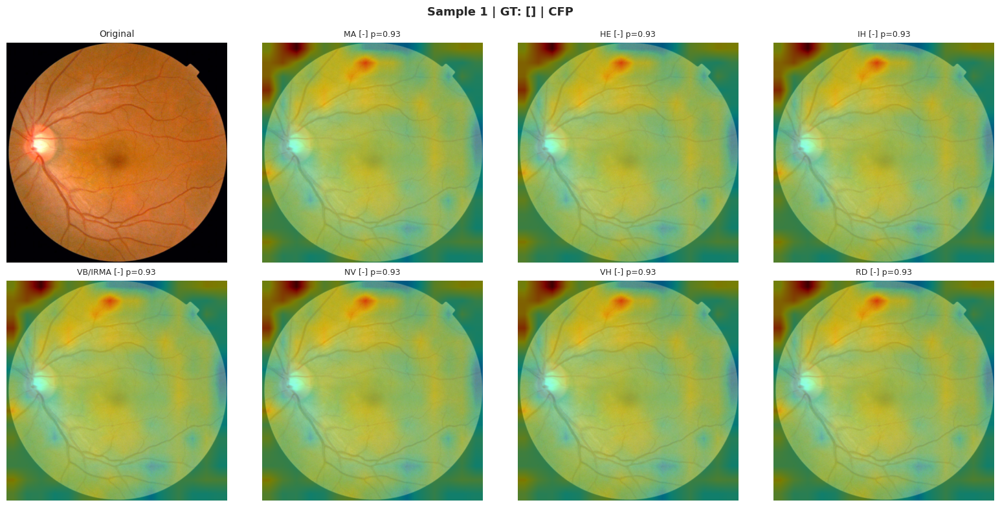

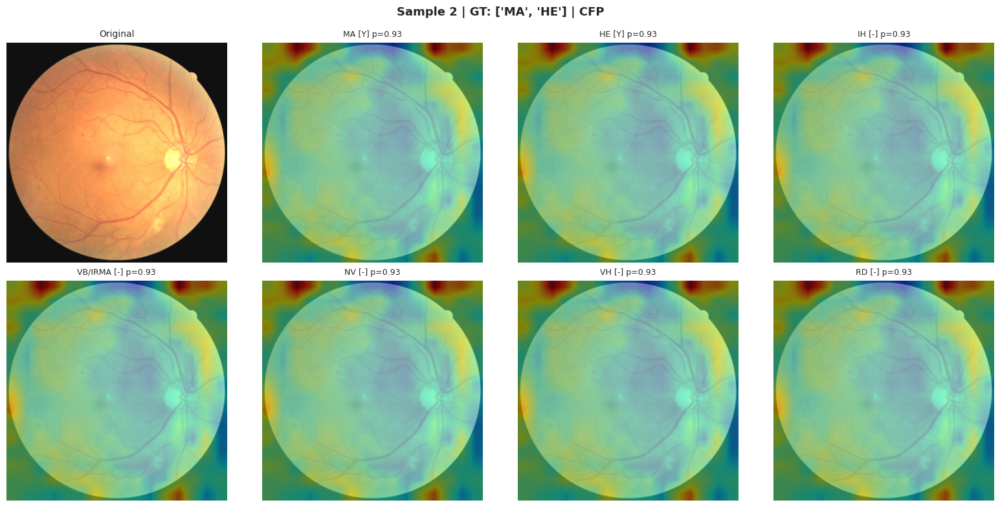

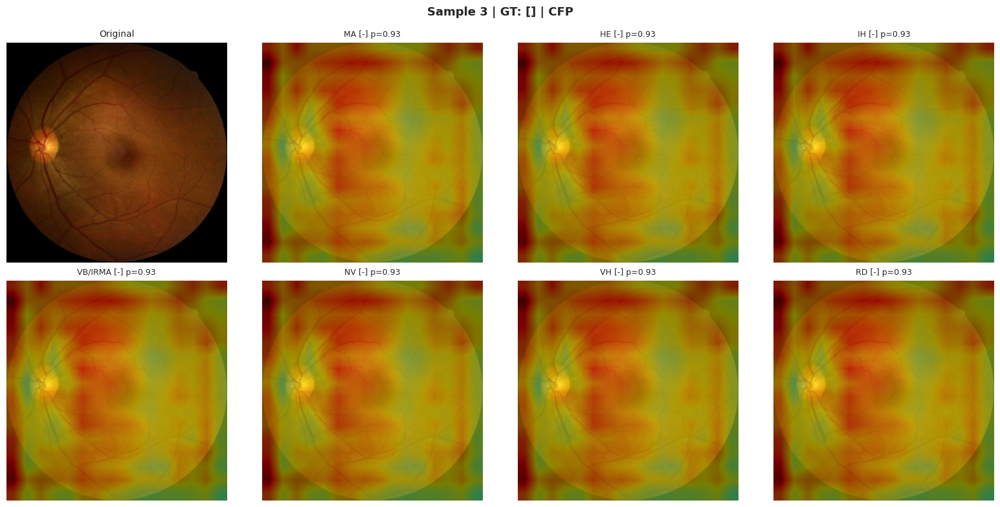

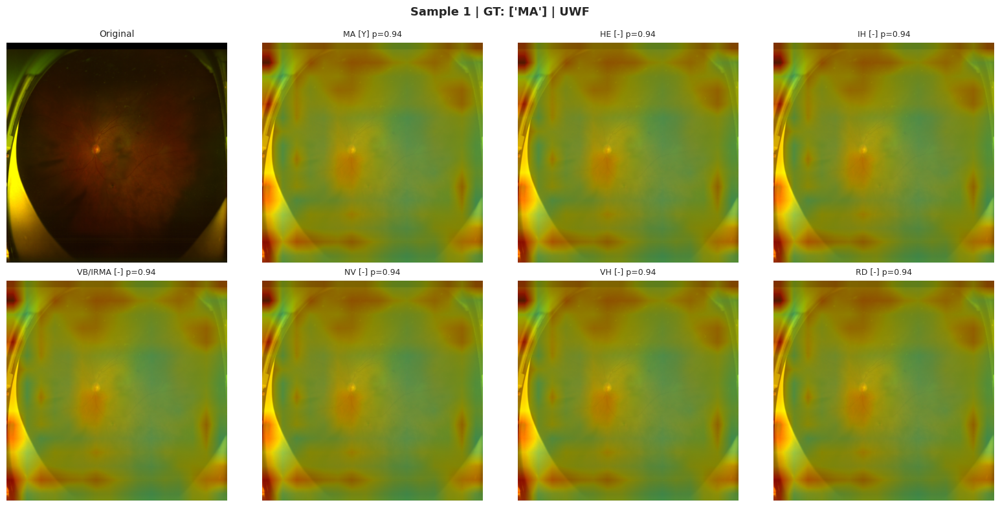

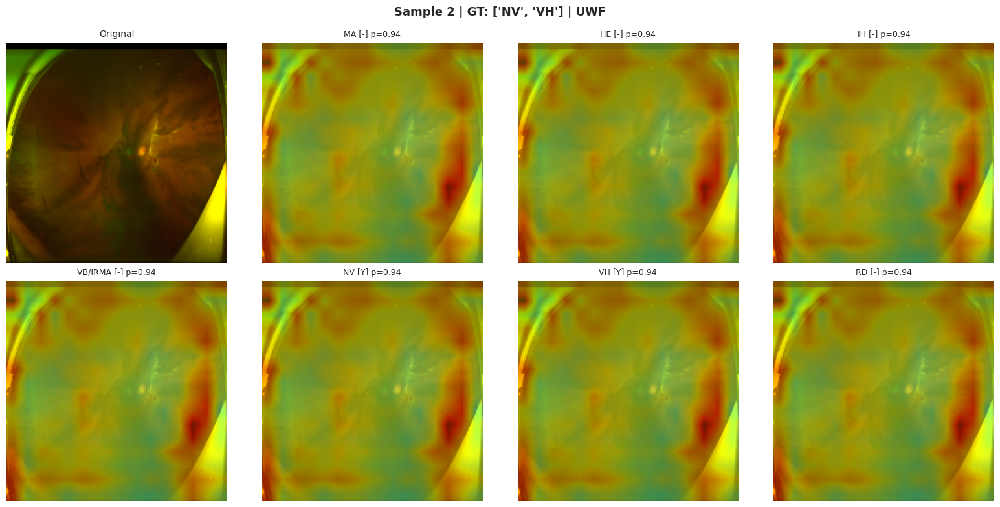

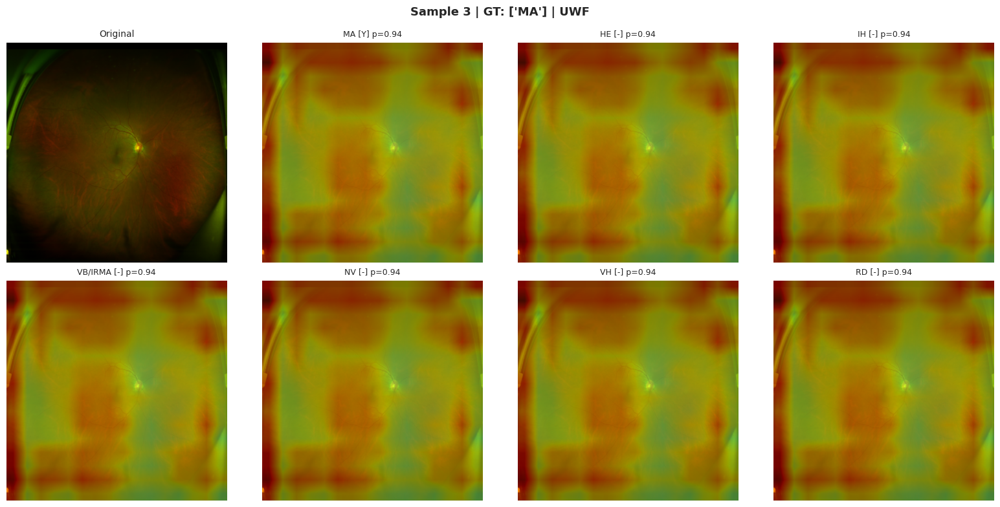

In [25]:
# Attention maps were captured during the single shared inference pass
# in Section 9 (PRED_CACHE['attention']) — no model reload needed here.

def visualize_attention(modality):
    """Visualize cached cross-attention maps for each label query."""
    if modality not in PRED_CACHE.get('attention', {}):
        print(f'No cached attention for {modality}.'); return

    data = PRED_CACHE['attention'][modality]
    images, labels, attn, logits = data['images'], data['labels'], data['attn'], data['logits']
    n_samples = images.size(0)

    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

    for sample_idx in range(n_samples):
        img_display = images[sample_idx] * std + mean
        img_display = img_display.permute(1, 2, 0).clamp(0, 1).numpy()

        lbl = labels[sample_idx].numpy()
        pred_probs = torch.sigmoid(logits[sample_idx]).numpy()
        present = [LESION_DISPLAY[i] for i in range(7) if lbl[i] == 1]

        fig, axes = plt.subplots(2, 4, figsize=(16, 8))
        fig.suptitle(f'Sample {sample_idx+1} | GT: {present} | {modality.upper()}',
                     fontsize=13, fontweight='bold')

        axes[0, 0].imshow(img_display)
        axes[0, 0].set_title('Original', fontsize=10)
        axes[0, 0].axis('off')

        for j, ax in enumerate(list(axes.flat[1:])):
            if j >= 7: ax.axis('off'); continue
            attn_map = attn[sample_idx, j].reshape(16, 16).numpy()
            attn_up = F.interpolate(
                torch.tensor(attn_map).unsqueeze(0).unsqueeze(0),
                size=(512, 512), mode='bilinear', align_corners=False
            ).squeeze().numpy()

            ax.imshow(img_display)
            ax.imshow(attn_up, cmap='jet', alpha=0.5, vmin=0)
            indicator = 'Y' if lbl[j] == 1 else '-'
            ax.set_title(f'{LESION_DISPLAY[j]} [{indicator}] p={pred_probs[j]:.2f}', fontsize=9)
            ax.axis('off')

        plt.tight_layout()
        plt.show()

for mod in PRED_CACHE.get('attention', {}):
    visualize_attention(mod)


---
## Section 15 — Modality Conditioning Visualization

Compare Exp D (CMQC) base queries vs modality-conditioned queries.

/kaggle/working/src/q2l_decoder.py:159: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.encoder = nn.TransformerEncoder(


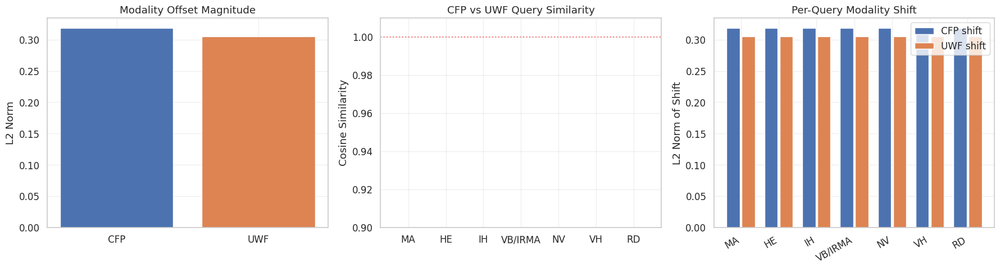

In [26]:
def visualize_modality_conditioning():
    cfg = get_config('d', project_root=PROJECT_ROOT)
    ckpt_path = cfg.output_dir / 'best_model.pth'
    if not ckpt_path.exists():
        print('Exp D not run yet. Skipping.'); return
    
    mdl = Q2LLesionModel(cfg, weights_path=BACKBONE_WEIGHTS).to(DEVICE)
    ckpt = torch.load(ckpt_path, map_location=DEVICE, weights_only=False)
    mdl.load_state_dict(ckpt.get('ema_state_dict', ckpt['model_state_dict']))
    mdl.eval()
    
    # Extract learned embeddings
    base_queries = mdl.decoder.label_queries.detach().cpu()  # (7, 1024)
    mod_offsets = mdl.decoder.modality_offset.weight.detach().cpu()  # (2, 1024)
    cfp_offset = mod_offsets[0]  # (1024,)
    uwf_offset = mod_offsets[1]  # (1024,)
    
    cfp_queries = base_queries + cfp_offset.unsqueeze(0)
    uwf_queries = base_queries + uwf_offset.unsqueeze(0)
    
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    
    # 1: Offset norms
    ax = axes[0]
    norms = [cfp_offset.norm().item(), uwf_offset.norm().item()]
    ax.bar(['CFP', 'UWF'], norms, color=['#4C72B0', '#DD8452'], edgecolor='white')
    ax.set_ylabel('L2 Norm'); ax.set_title('Modality Offset Magnitude')
    ax.grid(True, alpha=0.3)
    
    # 2: Cosine similarity between CFP and UWF queries
    ax = axes[1]
    cos_sims = F.cosine_similarity(cfp_queries, uwf_queries, dim=1).numpy()
    bars = ax.bar(LESION_DISPLAY, cos_sims, color=COLORS, edgecolor='white')
    ax.set_ylabel('Cosine Similarity'); ax.set_title('CFP vs UWF Query Similarity')
    ax.set_ylim(0.9, 1.01); ax.grid(True, alpha=0.3)
    ax.axhline(1.0, color='red', linestyle=':', alpha=0.5)
    
    # 3: Query shift per lesion (how much each query changes by modality)
    ax = axes[2]
    cfp_shift = (cfp_queries - base_queries).norm(dim=1).numpy()
    uwf_shift = (uwf_queries - base_queries).norm(dim=1).numpy()
    x = np.arange(7)
    ax.bar(x - 0.2, cfp_shift, 0.35, label='CFP shift', color='#4C72B0')
    ax.bar(x + 0.2, uwf_shift, 0.35, label='UWF shift', color='#DD8452')
    ax.set_xticks(x); ax.set_xticklabels(LESION_DISPLAY, rotation=30, ha='right')
    ax.set_ylabel('L2 Norm of Shift'); ax.set_title('Per-Query Modality Shift')
    ax.legend(); ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('outputs/modality_conditioning.png', dpi=100, bbox_inches='tight')
    plt.show()
    del mdl; torch.cuda.empty_cache()

visualize_modality_conditioning()

---
## Section 16 — Error Analysis

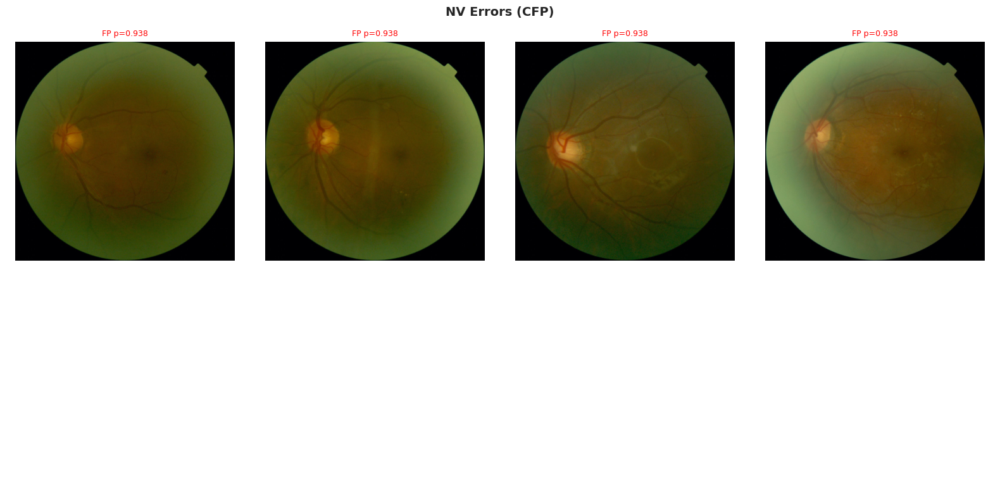

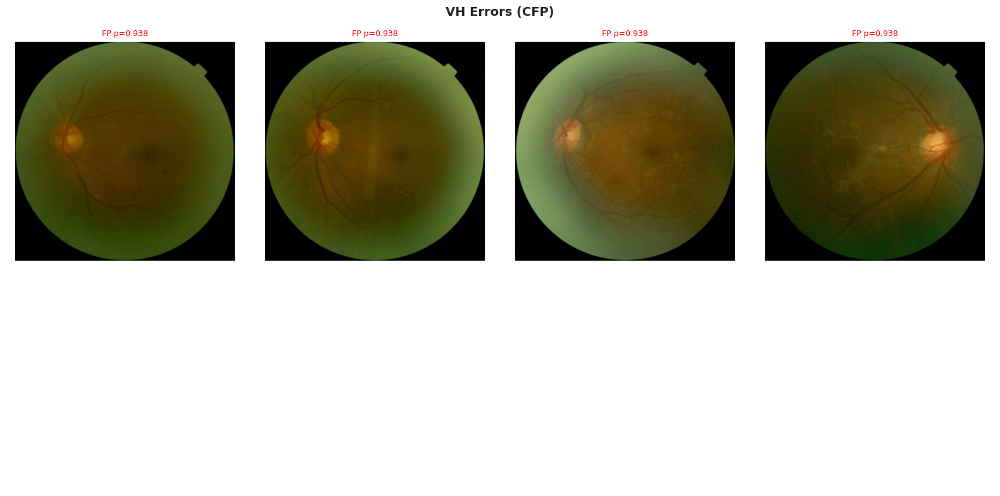

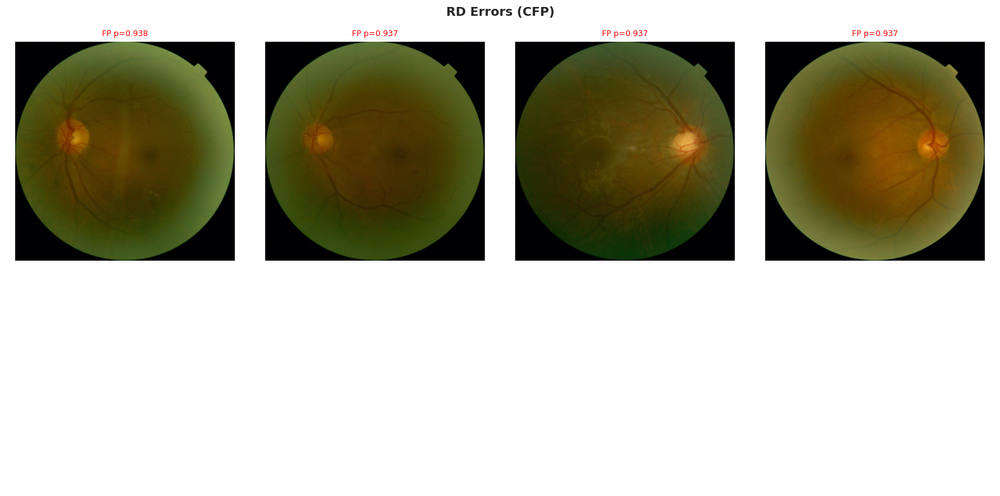

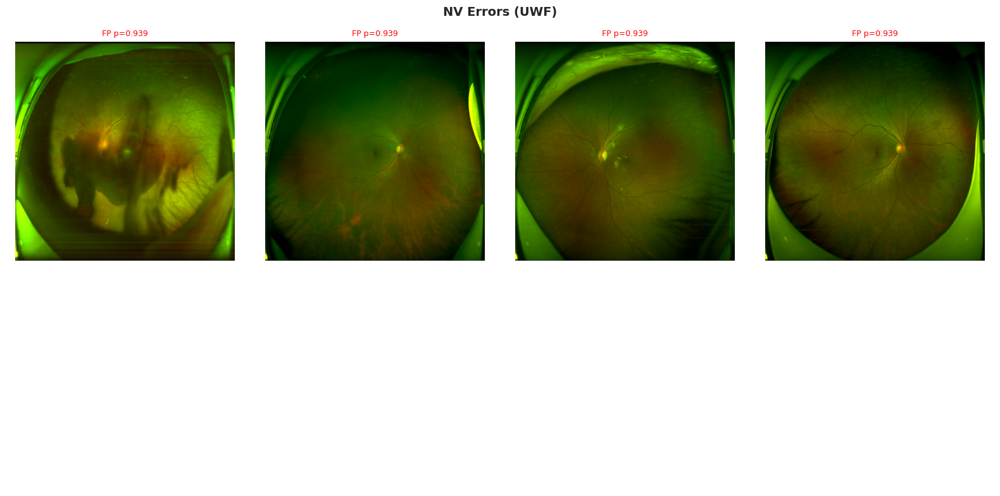

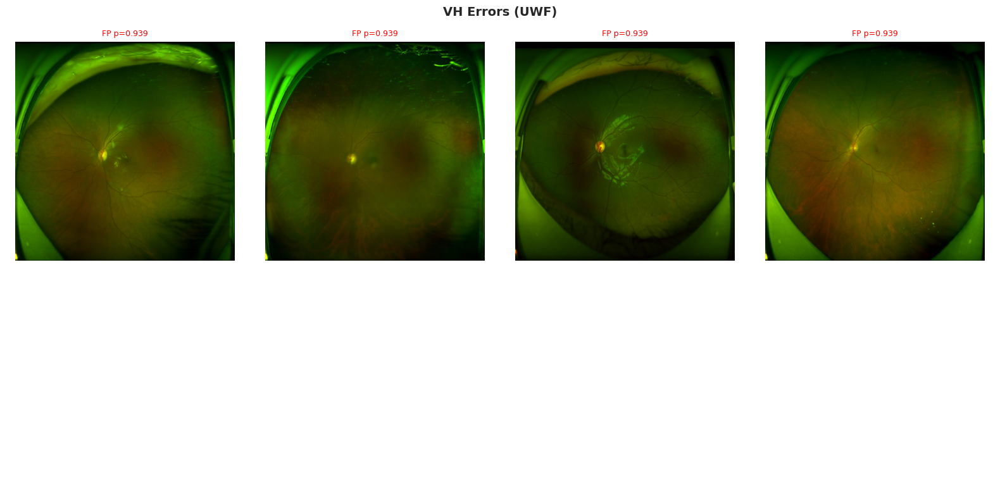

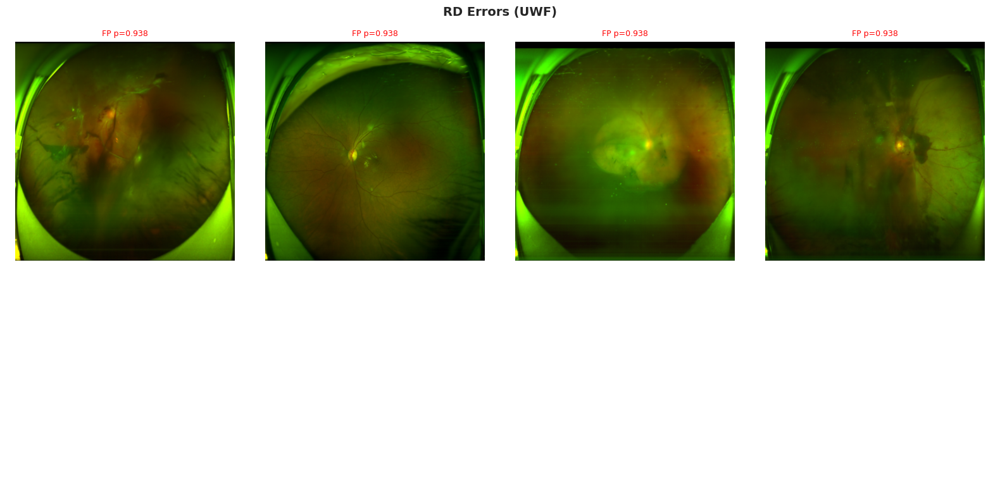

In [27]:
def error_analysis(modality, top_k=6):
    """Show worst false positives and false negatives for rare classes
    (uses cached test predictions — only the handful of images shown
    here are loaded individually)."""
    if modality not in PRED_CACHE.get('test', {}):
        print(f'No cached test predictions for {modality}.'); return

    probs, labels = PRED_CACHE['test'][modality]['probs'], PRED_CACHE['test'][modality]['labels']
    test_ds = PRED_CACHE['test'][modality]['dataset']
    thresholds = PRED_CACHE['thresholds']

    rare_indices = [4, 5, 6]  # NV, VH, RD

    for j in rare_indices:
        name = LESION_DISPLAY[j]
        t = thresholds.get(LESION_NAMES[j], 0.5)
        preds_j = (probs[:, j] >= t).astype(int)

        fp_mask = (preds_j == 1) & (labels[:, j] == 0)
        fp_indices = np.where(fp_mask)[0]
        fp_sorted = fp_indices[np.argsort(-probs[fp_indices, j])][:top_k]

        fn_mask = (preds_j == 0) & (labels[:, j] == 1)
        fn_indices = np.where(fn_mask)[0]
        fn_sorted = fn_indices[np.argsort(probs[fn_indices, j])][:top_k]

        if len(fp_sorted) == 0 and len(fn_sorted) == 0:
            print(f'{name}: No errors!'); continue

        n_show = max(len(fp_sorted), len(fn_sorted))
        fig, axes = plt.subplots(2, max(n_show, 1), figsize=(4*n_show, 8))
        if n_show == 1: axes = axes.reshape(2, 1)
        fig.suptitle(f'{name} Errors ({modality.upper()})', fontsize=14, fontweight='bold')

        for col in range(n_show):
            ax = axes[0, col]
            if col < len(fp_sorted):
                idx = fp_sorted[col]
                img, lbl, _ = test_ds[idx]
                img_show = img * torch.tensor([0.229,0.224,0.225]).view(3,1,1) + torch.tensor([0.485,0.456,0.406]).view(3,1,1)
                ax.imshow(img_show.permute(1,2,0).clamp(0,1).numpy())
                ax.set_title(f'FP p={probs[idx,j]:.3f}', fontsize=9, color='red')
            ax.axis('off')
            if col == 0: ax.set_ylabel('False Positives', fontsize=12)

            ax = axes[1, col]
            if col < len(fn_sorted):
                idx = fn_sorted[col]
                img, lbl, _ = test_ds[idx]
                img_show = img * torch.tensor([0.229,0.224,0.225]).view(3,1,1) + torch.tensor([0.485,0.456,0.406]).view(3,1,1)
                ax.imshow(img_show.permute(1,2,0).clamp(0,1).numpy())
                ax.set_title(f'FN p={probs[idx,j]:.3f}', fontsize=9, color='blue')
            ax.axis('off')
            if col == 0: ax.set_ylabel('False Negatives', fontsize=12)

        plt.tight_layout()
        plt.show()

for mod in PRED_CACHE.get('test', {}):
    error_analysis(mod, top_k=4)


---
## Section 17 — Final Results Dashboard

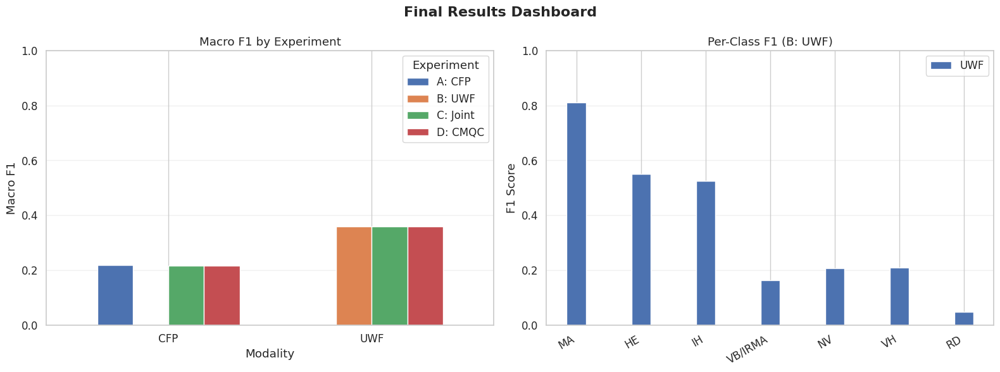


=== Complete Results ===


,Experiment,Modality,Macro F1,Accuracy,Exact Match,MA,HE,IH,VB/IRMA,NV,VH,RD
0,A: CFP,CFP,0.2182,0.2088,0.0000,0.5650,0.3706,0.3735,0.0379,0.1032,0.0465,0.0304
1,B: UWF,UWF,0.3594,0.2522,0.0031,0.8114,0.5512,0.5257,0.1634,0.2077,0.2083,0.0481
2,C: Joint,CFP,0.2165,0.1368,0.0000,0.5650,0.3706,0.3735,0.0379,0.1032,0.0465,0.0187
3,C: Joint,UWF,0.3594,0.2522,0.0031,0.8114,0.5512,0.5257,0.1634,0.2077,0.2083,0.0481
4,D: CMQC,CFP,0.2165,0.1368,0.0000,0.5650,0.3706,0.3735,0.0379,0.1032,0.0465,0.0187
5,D: CMQC,UWF,0.3594,0.2522,0.0031,0.8114,0.5512,0.5257,0.1634,0.2077,0.2083,0.0481



Best: B: UWF on UWF (Macro F1 = 0.3594)


In [28]:
def final_dashboard():
    all_results = load_all_results()
    if not all_results:
        print('No results. Run experiments first.'); return
    
    # Aggregate metrics
    rows = []
    for exp_label, res in all_results.items():
        for modality, mdata in res.items():
            m = mdata.get('metrics_at_optimized', {})
            rows.append({
                'Experiment': exp_label, 'Modality': modality.upper(),
                'Macro F1': m.get('macro_f1', 0),
                'Accuracy': m.get('element_accuracy', 0),
                'Exact Match': m.get('exact_match', 0),
                **{LESION_DISPLAY[i]: m.get(f'{LESION_NAMES[i]}_f1', 0) for i in range(7)}
            })
    
    df = pd.DataFrame(rows)
    
    # Grouped bar chart
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle('Final Results Dashboard', fontsize=16, fontweight='bold')
    
    # Left: Macro F1 by experiment and modality
    ax = axes[0]
    pivot = df.pivot(index='Modality', columns='Experiment', values='Macro F1')
    pivot.plot(kind='bar', ax=ax, edgecolor='white', width=0.7)
    ax.set_ylabel('Macro F1'); ax.set_title('Macro F1 by Experiment')
    ax.set_ylim(0, 1); ax.legend(title='Experiment')
    ax.grid(True, alpha=0.3, axis='y')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
    
    # Right: Per-class F1 for best experiment
    ax = axes[1]
    best_exp = df.loc[df['Macro F1'].idxmax(), 'Experiment']
    best_rows = df[df['Experiment'] == best_exp]
    x = np.arange(7)
    for i, (_, row) in enumerate(best_rows.iterrows()):
        vals = [row[LESION_DISPLAY[j]] for j in range(7)]
        offset = (i - len(best_rows)/2 + 0.5) * 0.35
        ax.bar(x + offset, vals, 0.3, label=row['Modality'], edgecolor='white')
    ax.set_xticks(x); ax.set_xticklabels(LESION_DISPLAY, rotation=30, ha='right')
    ax.set_ylabel('F1 Score'); ax.set_title(f'Per-Class F1 ({best_exp})')
    ax.set_ylim(0, 1); ax.legend(); ax.grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    plt.savefig('outputs/final_dashboard.png', dpi=100, bbox_inches='tight')
    plt.show()
    
    # Print styled table
    print('\n=== Complete Results ===')
    display(df.style.highlight_max(subset=['Macro F1'], color='lightgreen', axis=0)
              .format(precision=4))
    
    # Best model
    best_idx = df['Macro F1'].idxmax()
    print(f"\nBest: {df.loc[best_idx, 'Experiment']} on {df.loc[best_idx, 'Modality']} "
          f"(Macro F1 = {df.loc[best_idx, 'Macro F1']:.4f})")

final_dashboard()

---
## Section 18 — Model Export & Inference

In [29]:
def export_best_model(exp_key=None):
    """Export best model checkpoint + thresholds for deployment."""
    exp_key = exp_key or PRED_CACHE.get('exp_key', EXP_KEY)
    cfg_e = get_config(exp_key, project_root=PROJECT_ROOT)
    ckpt_path = cfg_e.output_dir / 'best_model.pth'
    thresh_path = cfg_e.output_dir / 'thresholds.json'

    if not ckpt_path.exists():
        print('No checkpoint found.'); return

    export_dir = pathlib.Path(PROJECT_ROOT) / 'outputs' / 'export'
    export_dir.mkdir(parents=True, exist_ok=True)

    import shutil
    shutil.copy2(ckpt_path, export_dir / 'model.pth')
    if thresh_path.exists():
        shutil.copy2(thresh_path, export_dir / 'thresholds.json')
    cfg_e.save(export_dir / 'config.json')

    print(f'Exported to {export_dir}/')
    print(f'  model.pth        ({ckpt_path.stat().st_size / 1e6:.1f} MB)')
    print(f'  thresholds.json')
    print(f'  config.json')

export_best_model()


Exported to /kaggle/working/outputs/export/
  model.pth        (2176.5 MB)
  thresholds.json
  config.json


/kaggle/working/src/q2l_decoder.py:159: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.encoder = nn.TransformerEncoder(


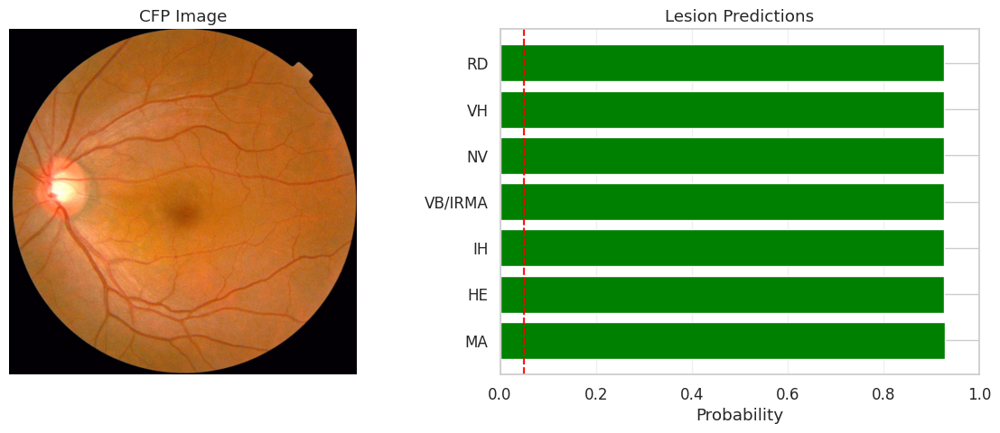

Detected lesions: ['MA', 'HE', 'IH', 'VB/IRMA', 'NV', 'VH', 'RD']


In [30]:
from src.dataset import get_val_transform

def predict_single_image(image_path, exp_key=None, modality='cfp'):
    """Run inference on a single image (loads model on demand)."""
    exp_key = exp_key or PRED_CACHE.get('exp_key', EXP_KEY)
    mdl, cfg_e = load_experiment_model(exp_key)
    if mdl is None:
        print('No checkpoint found.'); return

    thresh_path = cfg_e.output_dir / 'thresholds.json'
    with open(thresh_path) as f:
        thresholds = json.load(f)

    transform = get_val_transform()
    img = Image.open(image_path).convert('RGB')
    img_tensor = transform(img).unsqueeze(0).to(DEVICE)
    mod_id = torch.tensor([0 if modality == 'cfp' else 1], device=DEVICE)

    with torch.no_grad(), torch.amp.autocast(device_type='cuda', enabled=True):
        logits = mdl(img_tensor, mod_id)
    probs = torch.sigmoid(logits).cpu().numpy()[0]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    ax1.imshow(img); ax1.set_title(f'{modality.upper()} Image'); ax1.axis('off')

    colors_pred = ['green' if probs[i] >= thresholds.get(LESION_NAMES[i], 0.5) else 'gray'
                   for i in range(7)]
    bars = ax2.barh(LESION_DISPLAY, probs, color=colors_pred, edgecolor='white')
    for i, t in enumerate([thresholds.get(n, 0.5) for n in LESION_NAMES]):
        ax2.axvline(t, color='red', alpha=0.3, linestyle='--')
    ax2.set_xlabel('Probability'); ax2.set_title('Lesion Predictions')
    ax2.set_xlim(0, 1); ax2.grid(True, alpha=0.3, axis='x')

    plt.tight_layout()
    plt.show()

    detected = [LESION_DISPLAY[i] for i in range(7)
                if probs[i] >= thresholds.get(LESION_NAMES[i], 0.5)]
    print(f"Detected lesions: {detected if detected else 'None'}")

    del mdl; torch.cuda.empty_cache()

# Example: predict on a test image
sample_img = DATA_DIR / 'MMRDR-CFP' / 'img' / 'ts000001.jpg'
if sample_img.exists():
    predict_single_image(sample_img, modality='cfp')
else:
    print(f'Sample image not found at {sample_img}')


---
## End

All experiments complete. Results are saved in `outputs/`.